In [1]:
!pip install ultralytics --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 949.8/949.8 kB 16.4 MB/s eta 0:00:00a 0:00:01


In [2]:
# Cell 1: Import Libraries and Load YAML Configuration
import os
import yaml
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt

# Path to your dataset YAML file (update the path accordingly)
yaml_path = "/kaggle/input/yamldataset/data.yaml"  # Replace with your actual YAML file path

# Load the YAML file to get dataset details and class names
with open(yaml_path, "r") as f:
    data = yaml.safe_load(f)

# Retrieve the class names (order matters!)
class_names = data.get("names", [])
print(f"Loaded {len(class_names)} classes:")
print(class_names)


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Loaded 82 classes:
['Bear', 'Brown-bear', 'Bull', 'Butterfly', 'Camel', 'Canary', 'Caterpillar', 'Cattle', 'Centipede', 'Cheetah', 'Chicken', 'Crab', 'Crocodile', 'Deer', 'Duck', 'Eagle', 'Elephant', 'Fish', 'Fox', 'Frog', 'Giraffe', 'Goat', 'Goldfish', 'Goose', 'Hamster', 'Harbor-seal', 'Hedgehog', 'Hippopotamus', 'Horse', 'Jaguar', 'Jellyfish', 'Kangaroo', 'Koala', 'Ladybug', 'Leopard', 'Lion', 'Lizard', 'Lynx', 'Magpie', 'Monkey', 'Moths-and-butterflies', 'Mouse', 'Mule', 'Ostrich', 'Otter', 'Owl', 'Panda', 'Parrot', 'Penguin', 'Pig', 'Polar-bear', 'Rabbit', 'Raccoon', 'Raven', 'Red-panda', 'Rhinoceros', 'Scorpion', 'Sea-lion', 'Sea-turtle', 'Seahorse', 'Shark', 'Sheep', 'Shrim

In [3]:
dataset_path = "/kaggle/input/yolo-dataset"
# Check if dataset folder exists
if os.path.exists(dataset_path):
    print("Dataset found ✅")
    print("Contents:", os.listdir(dataset_path))
else:
    print("Dataset NOT found ❌")

Dataset found ✅
Contents: ['valid', 'test', 'train']


In [4]:
print("Train Images:", os.listdir(f"{dataset_path}/train/images")[:5])  # Show first 5 images
print("Validation Images:", os.listdir(f"{dataset_path}/valid/images")[:5])
print("Test Images:", os.listdir(f"{dataset_path}/test/images")[:5])

Train Images: ['021b038e2fb6da93_jpg.rf.f2f72602df62ffd5d5a8ffa1c66b5cc9.jpg', '04e5fb6849aabe1f_jpg.rf.582b239127fdb033131ee4ed9c09ccc7.jpg', '8ce2fd892c31098d_jpg.rf.1b6e443777f4d2ba61937677fd59d484.jpg', '177d84c93f687110_jpg.rf.47839a2e23af1678992fafbc91ab88cf.jpg', '6ec0d732ad98ffc4_jpg.rf.deaa062450f0d32a27a8465310d31eee.jpg']
Validation Images: ['07762a2590a9fbdc_jpg.rf.7bd8c431a84cb7a0951844dc5e4d1d79.jpg', 'e5f6a77ce93042cb_jpg.rf.ce4e1520c9173f8ad3aad202460e3b81.jpg', '43c255014a081276_jpg.rf.f2a0e917fc938e723f4281819a99556e.jpg', 'b5c461c1869e3917_jpg.rf.9e8d3dbe39d31fcb6fe306d5f4325be1.jpg', '0427c19fdb383dca_jpg.rf.f38e23b056bfb3885f5ca46be3d466f9.jpg']
Test Images: ['a467778954c611d8_jpg.rf.a187c4544d07416c4532ec115e3ffc4d.jpg', 'a35bba3fc0cc4dfe_jpg.rf.94f8db320633227dc4e3faeb3b82c60c.jpg', 'image--125-_jpg.rf.1bc95efee0443d9662b8d88874fbf6f9.jpg', 'image--3-_jpg.rf.e05d620022de44df9d11145f5c1a9ba7.jpg', '616991bc6e95e86e_jpg.rf.28cf082a8b9b78e76e09e33112d2a901.jpg']


In [5]:
import glob

label_folder = "/kaggle/input/yolo-dataset/test/labels"
all_ids = []
for txt_file in glob.glob(label_folder + "/*.txt"):
    with open(txt_file, "r") as f:
        for line in f:
            parts = line.strip().split()
            class_id = int(parts[0])
            all_ids.append(class_id)

print("Min class ID:", min(all_ids))
print("Max class ID:", max(all_ids))


Min class ID: 0
Max class ID: 81


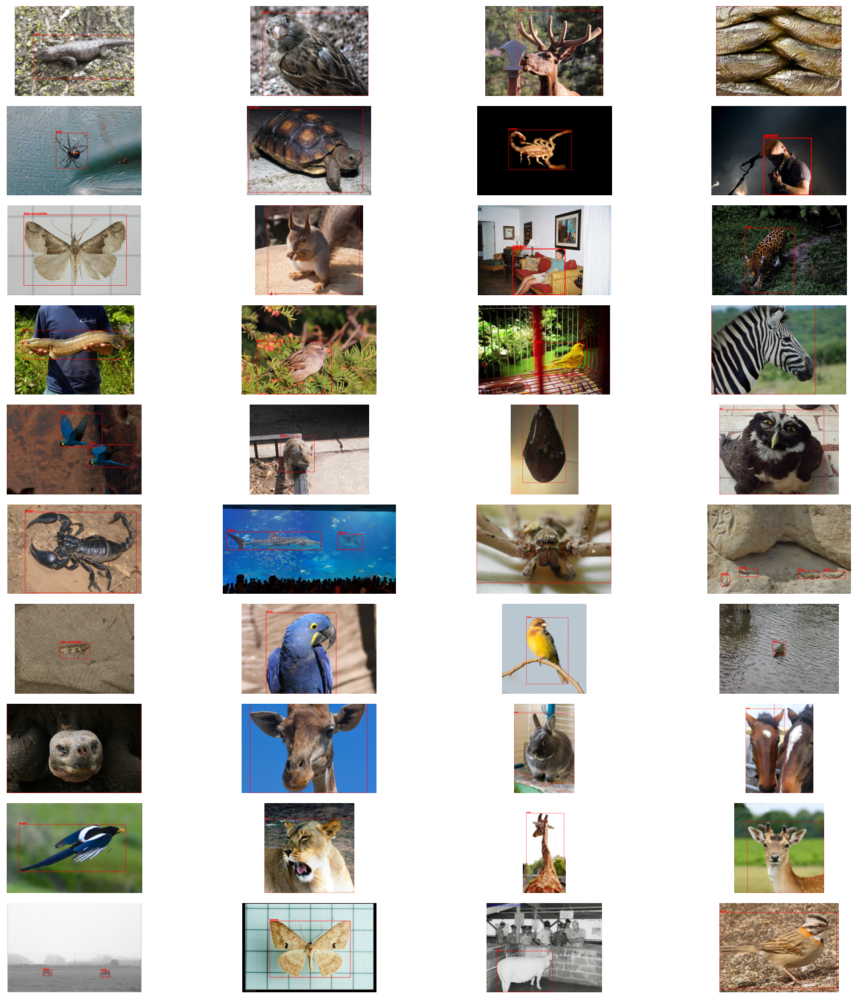

In [6]:
import cv2
import matplotlib.pyplot as plt
import glob
import os
import random

# Function to visualize images with bounding boxes in a grid
def plot_images_with_boxes(image_folder, label_folder, class_names, num_images=16, rows=4, cols=4):
    # Gather all image paths and randomly select the required number of images
    all_image_paths = glob.glob(f"{image_folder}/*.jpg")
    image_paths = random.sample(all_image_paths, min(num_images, len(all_image_paths)))
    
    fig, axes = plt.subplots(rows, cols, figsize=(15, 15))
    
    for ax, img_path in zip(axes.flat, image_paths):
        # Read image and convert color from BGR to RGB
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        # Construct the corresponding label file path
        label_path = img_path.replace("images", "labels").replace(".jpg", ".txt")
        
        if os.path.exists(label_path):
            with open(label_path, "r") as file:
                labels = file.readlines()
            
            for label in labels:
                data = label.strip().split()
                if len(data) != 5:
                    # Skip labels that don't have the expected 5 values
                    continue
                class_id, x_center, y_center, width, height = map(float, data)
                
                # Convert YOLO format (normalized coordinates) to pixel values
                img_h, img_w = img.shape[:2]
                x1 = int((x_center - width / 2) * img_w)
                y1 = int((y_center - height / 2) * img_h)
                x2 = int((x_center + width / 2) * img_w)
                y2 = int((y_center + height / 2) * img_h)
                
                # Check if class_id is within the valid range
                if int(class_id) < len(class_names):
                    label_text = class_names[int(class_id)]
                else:
                    label_text = "Unknown"
                
                # Draw the bounding box and label on the image
                cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 2)
                cv2.putText(img, label_text, (x1, y1 - 5), 
                            cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)
        
        ax.imshow(img)
        ax.axis("off")
    
    plt.tight_layout()
    plt.show()

# Set paths for training images and labels
train_image_folder = f"/kaggle/input/yolo-dataset/train/images"
train_label_folder = f"/kaggle/input/yolo-dataset/train/labels"

# Define class names (ensure this list covers all possible classes in your dataset)
class_names =  ['Bear', 'Brown-bear', 'Bull', 'Butterfly', 'Camel', 'Canary', 'Caterpillar', 'Cattle', 'Centipede', 'Cheetah', 'Chicken', 'Crab', 'Crocodile', 'Deer', 'Duck', 'Eagle', 'Elephant', 'Fish', 'Fox', 'Frog', 'Giraffe', 'Goat', 'Goldfish', 'Goose', 'Hamster', 'Harbor-seal', 'Hedgehog', 'Hippopotamus', 'Horse', 'Jaguar', 'Jellyfish', 'Kangaroo', 'Koala', 'Ladybug', 'Leopard', 'Lion', 'Lizard', 'Lynx', 'Magpie', 'Monkey', 'Moths-and-butterflies', 'Mouse', 'Mule', 'Ostrich', 'Otter', 'Owl', 'Panda', 'Parrot', 'Penguin', 'Pig', 'Polar-bear', 'Rabbit', 'Raccoon', 'Raven', 'Red-panda', 'Rhinoceros', 'Scorpion', 'Sea-lion', 'Sea-turtle', 'Seahorse', 'Shark', 'Sheep', 'Shrimp', 'Snail', 'Snake', 'Sparrow', 'Spider', 'Squid', 'Squirrel', 'Starfish', 'Swan', 'Tick', 'Tiger', 'Tortoise', 'Turkey', 'Turtle', 'Whale', 'Woodpecker', 'Worm', 'Zebra', 'person', 'person-like']

# Visualize sample training images with bounding boxes in a 4x4 grid
plot_images_with_boxes(train_image_folder, train_label_folder, class_names, num_images=82, rows=10, cols=4)


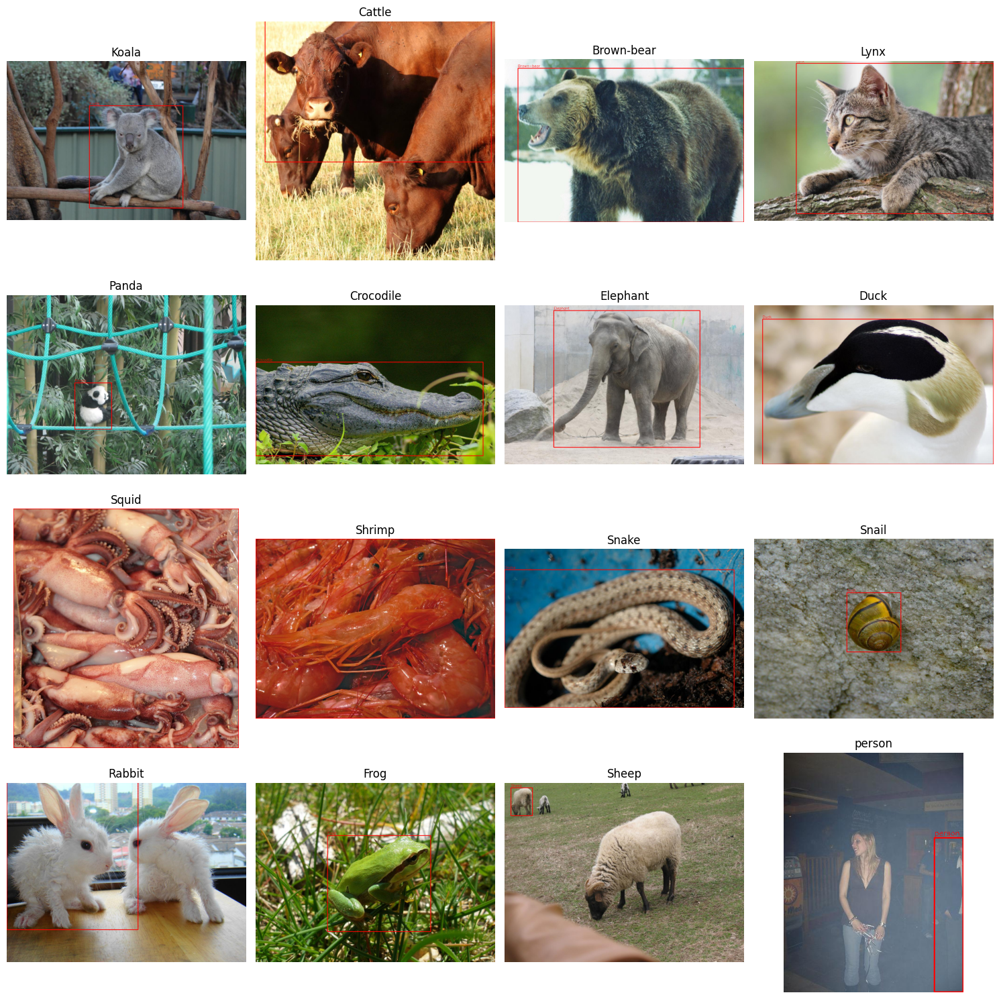

In [7]:
import glob
import random
import os
import cv2
import matplotlib.pyplot as plt

def plot_sample_images_per_class(image_folder, label_folder, class_names, num_classes=16, rows=4, cols=4):
    """
    For each randomly chosen class, this function:
      1. Finds all bounding boxes in the dataset belonging to that class.
      2. Randomly picks one bounding box and image.
      3. Draws that bounding box (in red) and displays the image in a grid.
    """
    # Build a dictionary: class_id -> list of (img_path, (x_c, y_c, w, h))
    class_to_bboxes = {i: [] for i in range(len(class_names))}

    # Gather all label files
    label_files = glob.glob(os.path.join(label_folder, "*.txt"))

    for label_file in label_files:
        # Corresponding image path (assuming .jpg files)
        img_path = label_file.replace("labels", "images").replace(".txt", ".jpg")
        
        if not os.path.exists(img_path):
            # If the image does not exist (maybe it's .png?), skip or adjust the extension
            continue
        
        # Read each line in the label file
        with open(label_file, "r") as f:
            for line in f:
                parts = line.strip().split()
                if len(parts) == 5:
                    class_id = int(parts[0])
                    x_c, y_c, w, h = map(float, parts[1:])
                    
                    # Make sure class_id is valid
                    if 0 <= class_id < len(class_names):
                        class_to_bboxes[class_id].append((img_path, (x_c, y_c, w, h)))

    # Randomly choose classes to display
    chosen_classes = random.sample(class_names, min(num_classes, len(class_names)))
    
    # Create the figure
    fig, axes = plt.subplots(rows, cols, figsize=(15, 15))
    
    for ax, class_name in zip(axes.flat, chosen_classes):
        # Find the class index from the class name
        class_idx = class_names.index(class_name)
        
        # All bounding boxes for this class
        bboxes_for_class = class_to_bboxes[class_idx]
        
        if not bboxes_for_class:
            # No images found for this class
            ax.set_title(f"{class_name} (No Images)")
            ax.axis("off")
            continue
        
        # Pick a random bounding box from the available list
        img_path, (x_c, y_c, w, h) = random.choice(bboxes_for_class)
        
        # Read the image
        img_bgr = cv2.imread(img_path)
        if img_bgr is None:
            ax.set_title(f"{class_name} (Image not found)")
            ax.axis("off")
            continue
        
        # Convert to RGB for plotting
        img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
        img_h, img_w = img_rgb.shape[:2]
        
        # Convert YOLO bounding box (relative coords) to pixel coords
        x1 = int((x_c - w / 2) * img_w)
        y1 = int((y_c - h / 2) * img_h)
        x2 = int((x_c + w / 2) * img_w)
        y2 = int((y_c + h / 2) * img_h)
        
        # Draw the bounding box in red
        cv2.rectangle(img_rgb, (x1, y1), (x2, y2), (255, 0, 0), 2)
        
        # Display the class name at the top-left corner
        cv2.putText(img_rgb, class_name, (x1, y1 - 5),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 1)
        
        # Show the image
        ax.imshow(img_rgb)
        ax.set_title(class_name)
        ax.axis("off")
    
    plt.tight_layout()
    plt.show()

# Example usage:
# Make sure the order of 'class_names' matches your dataset labeling order
class_names = ['Bear', 'Brown-bear', 'Bull', 'Butterfly', 'Camel', 'Canary', 'Caterpillar', 'Cattle', 'Centipede', 'Cheetah', 'Chicken', 'Crab', 'Crocodile', 'Deer', 'Duck', 'Eagle', 'Elephant', 'Fish', 'Fox', 'Frog', 'Giraffe', 'Goat', 'Goldfish', 'Goose', 'Hamster', 'Harbor-seal', 'Hedgehog', 'Hippopotamus', 'Horse', 'Jaguar', 'Jellyfish', 'Kangaroo', 'Koala', 'Ladybug', 'Leopard', 'Lion', 'Lizard', 'Lynx', 'Magpie', 'Monkey', 'Moths-and-butterflies', 'Mouse', 'Mule', 'Ostrich', 'Otter', 'Owl', 'Panda', 'Parrot', 'Penguin', 'Pig', 'Polar-bear', 'Rabbit', 'Raccoon', 'Raven', 'Red-panda', 'Rhinoceros', 'Scorpion', 'Sea-lion', 'Sea-turtle', 'Seahorse', 'Shark', 'Sheep', 'Shrimp', 'Snail', 'Snake', 'Sparrow', 'Spider', 'Squid', 'Squirrel', 'Starfish', 'Swan', 'Tick', 'Tiger', 'Tortoise', 'Turkey', 'Turtle', 'Whale', 'Woodpecker', 'Worm', 'Zebra', 'person', 'person-like']

# If your folders are structured as YOLO expects:
train_image_folder = "/kaggle/input/yolo-dataset/train/images"
train_label_folder = "/kaggle/input/yolo-dataset/train/labels"

plot_sample_images_per_class(
    image_folder=train_image_folder,
    label_folder=train_label_folder,
    class_names=class_names,
    num_classes=16,  # e.g. display 16 random classes
    rows=4,
    cols=4
)


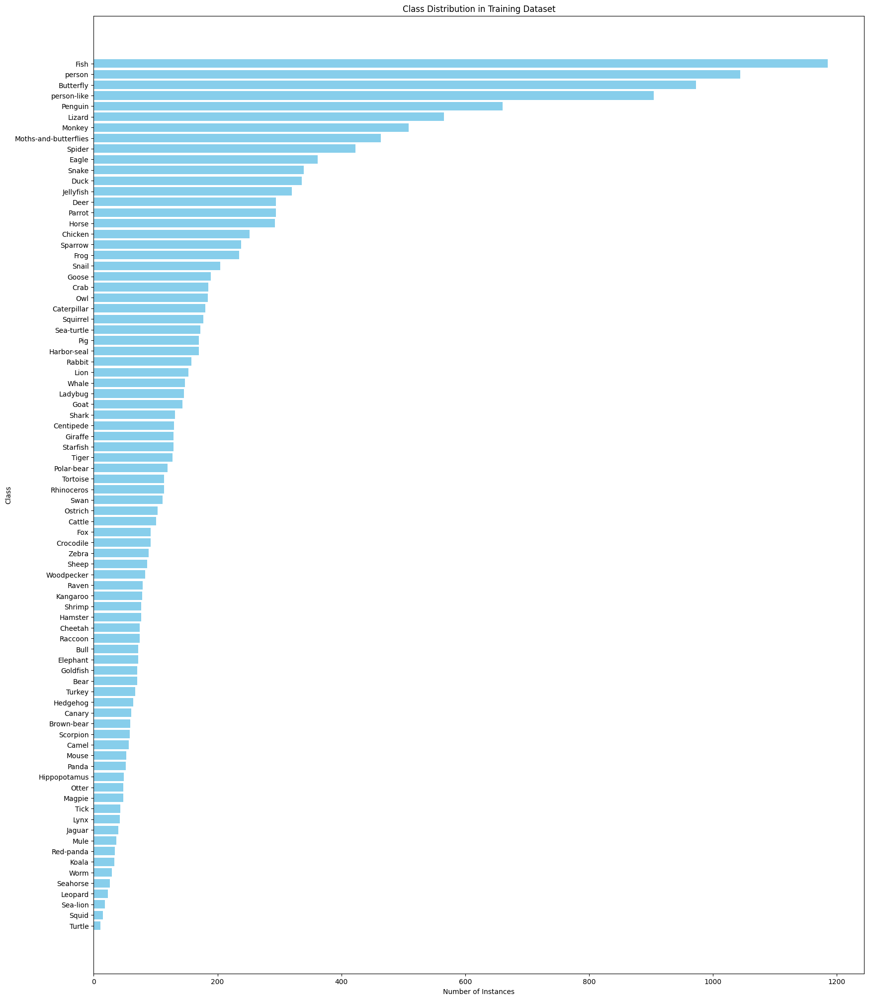

In [13]:
import pandas as pd
import glob
from collections import Counter
import matplotlib.pyplot as plt

def count_class_instances(label_folder):
    class_counts = Counter()
    label_files = glob.glob(f"{label_folder}/*.txt")
    for label_file in label_files:
        with open(label_file, "r") as file:
            for label in file:
                class_id = int(label.split()[0])
                class_counts[class_id] += 1
    return class_counts

# Assume train_label_folder is defined (e.g., "/kaggle/input/yolo-dataset/train/labels")
train_class_counts = count_class_instances(train_label_folder)

# Define your 82 class names
names: ['Bear', 'Brown-bear', 'Bull', 'Butterfly', 'Camel', 'Canary', 'Caterpillar', 'Cattle', 'Centipede', 'Cheetah', 'Chicken', 'Crab', 'Crocodile', 'Deer', 'Duck', 'Eagle', 'Elephant', 'Fish', 'Fox', 'Frog', 'Giraffe', 'Goat', 'Goldfish', 'Goose', 'Hamster', 'Harbor-seal', 'Hedgehog', 'Hippopotamus', 'Horse', 'Jaguar', 'Jellyfish', 'Kangaroo', 'Koala', 'Ladybug', 'Leopard', 'Lion', 'Lizard', 'Lynx', 'Magpie', 'Monkey', 'Moths-and-butterflies', 'Mouse', 'Mule', 'Ostrich', 'Otter', 'Owl', 'Panda', 'Parrot', 'Penguin', 'Pig', 'Polar-bear', 'Rabbit', 'Raccoon', 'Raven', 'Red-panda', 'Rhinoceros', 'Scorpion', 'Sea-lion', 'Sea-turtle', 'Seahorse', 'Shark', 'Sheep', 'Shrimp', 'Snail', 'Snake', 'Sparrow', 'Spider', 'Squid', 'Squirrel', 'Starfish', 'Swan', 'Tick', 'Tiger', 'Tortoise', 'Turkey', 'Turtle', 'Whale', 'Woodpecker', 'Worm', 'Zebra', 'person', 'person-like']

# Convert the Counter to a list of counts corresponding to each class in class_names
instance_counts = [train_class_counts.get(i, 0) for i in range(len(class_names))]

# Create DataFrame and sort by the number of instances
df = pd.DataFrame({"Class": class_names, "Instances": instance_counts})
df = df.sort_values(by="Instances", ascending=False)

# Plot class distribution
plt.figure(figsize=(20, 25))
plt.barh(df["Class"], df["Instances"], color="skyblue")
plt.xlabel("Number of Instances")
plt.ylabel("Class")
plt.title("Class Distribution in Training Dataset")
plt.gca().invert_yaxis()
plt.show()


/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


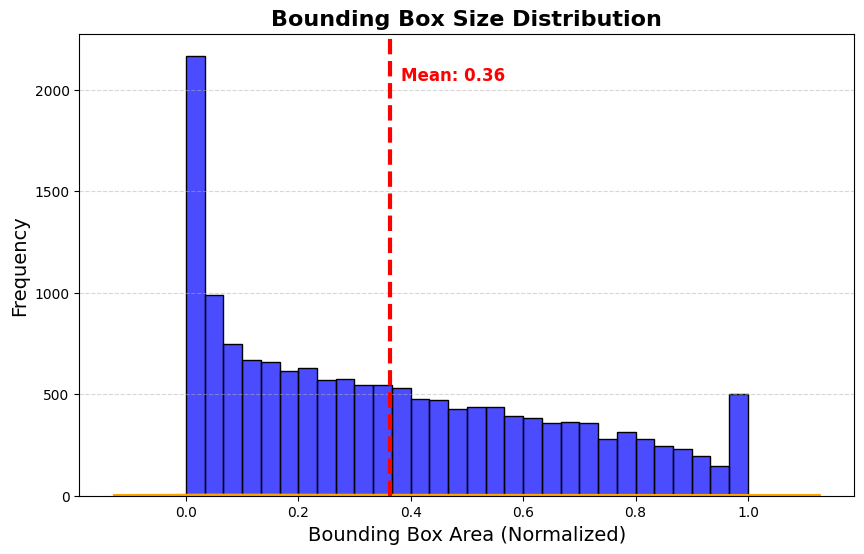

In [8]:
import seaborn as sns
import matplotlib.pyplot as plt
import glob

def plot_bbox_size_distribution(label_folder):
    bbox_sizes = []
    
    label_files = glob.glob(f"{label_folder}/*.txt")
    
    for label_file in label_files:
        with open(label_file, "r") as file:
            labels = file.readlines()
            for label in labels:
                _, _, _, width, height = map(float, label.strip().split())
                bbox_sizes.append(width * height)  # Area of bounding box

    # Create a larger figure
    plt.figure(figsize=(10, 6))

    # Create histogram
    sns.histplot(bbox_sizes, bins=30, color="blue", edgecolor="black", alpha=0.7)

    # Add KDE plot with better visibility
    sns.kdeplot(bbox_sizes, color="orange", linewidth=2.5)

    # Add mean line and annotation
    mean_bbox_size = sum(bbox_sizes) / len(bbox_sizes)
    plt.axvline(mean_bbox_size, color='red', linestyle='dashed', linewidth=3)
    plt.text(mean_bbox_size + 0.02, max(plt.ylim()) * 0.9, 
             f"Mean: {mean_bbox_size:.2f}", color="red", fontsize=12, fontweight="bold")

    # Labels and title
    plt.xlabel("Bounding Box Area (Normalized)", fontsize=14)
    plt.ylabel("Frequency", fontsize=14)
    plt.title("Bounding Box Size Distribution", fontsize=16, fontweight="bold")

    # Improve grid readability
    plt.grid(axis='y', linestyle='--', alpha=0.5)

    # Optional: Use log scale for better small object distribution
    # plt.xscale("log")

    # Show plot
    plt.show()

# Plot bounding box size distribution
plot_bbox_size_distribution(train_label_folder)

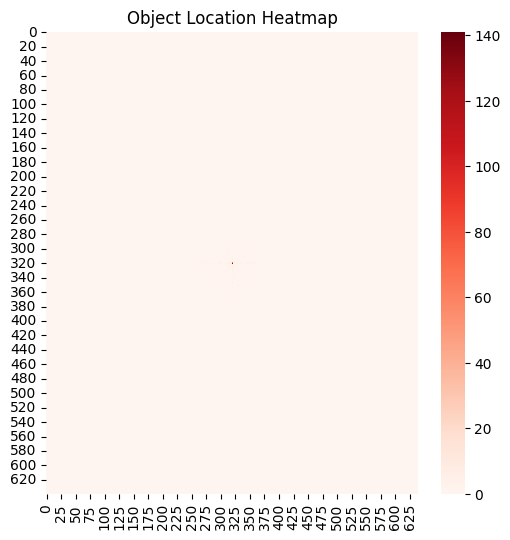

In [8]:
import numpy as np

def plot_heatmap(label_folder, img_size=640):
    heatmap = np.zeros((img_size, img_size))
    
    label_files = glob.glob(f"{label_folder}/*.txt")
    
    for label_file in label_files:
        with open(label_file, "r") as file:
            labels = file.readlines()
            for label in labels:
                _, x_center, y_center, width, height = map(float, label.strip().split())

                # Convert to pixel coordinates
                x = int(x_center * img_size)
                y = int(y_center * img_size)

                heatmap[y, x] += 1  # Increment frequency

    plt.figure(figsize=(6,6))
    sns.heatmap(heatmap, cmap="Reds", cbar=True)
    plt.title("Object Location Heatmap")
    plt.show()

# Plot heatmap of object locations
plot_heatmap(train_label_folder)

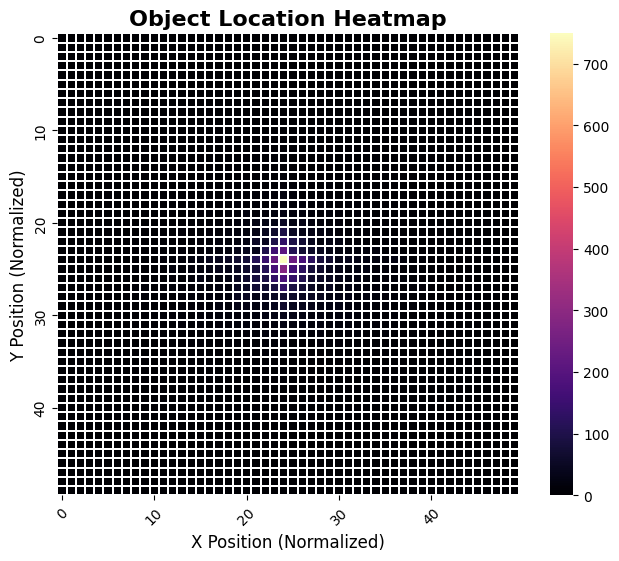

In [9]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import glob

def plot_heatmap(label_folder, img_size=640, grid_size=50):
    heatmap = np.zeros((grid_size, grid_size))  # Reduce resolution for better aggregation
    
    label_files = glob.glob(f"{label_folder}/*.txt")
    
    for label_file in label_files:
        with open(label_file, "r") as file:
            labels = file.readlines()
            for label in labels:
                _, x_center, y_center, _, _ = map(float, label.strip().split())

                # Convert to grid coordinates
                x = int(x_center * (grid_size - 1))
                y = int(y_center * (grid_size - 1))

                heatmap[y, x] += 1  # Increment frequency

    plt.figure(figsize=(8, 6))
    
    # Choose a better colormap for contrast
    sns.heatmap(heatmap, cmap="magma", cbar=True, linewidths=0.1, square=True, 
                xticklabels=10, yticklabels=10)

    # Improve axis readability
    plt.xticks(rotation=45, fontsize=10)
    plt.yticks(fontsize=10)

    # Title & Labels
    plt.title("Object Location Heatmap", fontsize=16, fontweight="bold")
    plt.xlabel("X Position (Normalized)", fontsize=12)
    plt.ylabel("Y Position (Normalized)", fontsize=12)

    plt.show()

# Plot heatmap with improvements
plot_heatmap(train_label_folder)

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


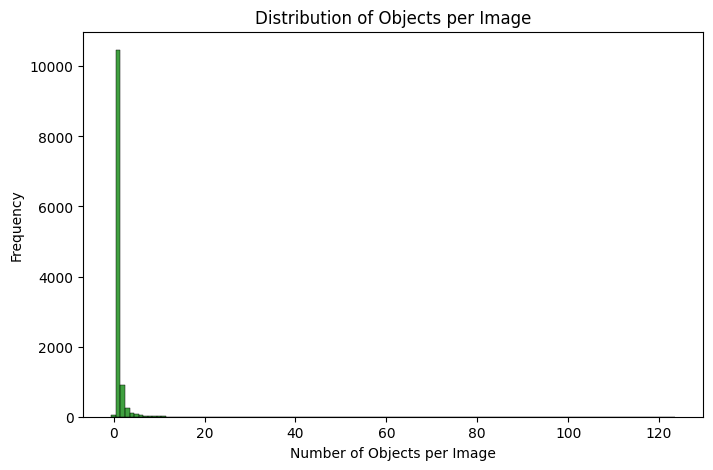

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns
import glob

def plot_avg_objects_per_image(label_folder):
    num_objects = []
    
    label_files = glob.glob(f"{label_folder}/*.txt")
    
    for label_file in label_files:
        with open(label_file, "r") as file:
            labels = file.readlines()
            num_objects.append(len(labels))  

    plt.figure(figsize=(8, 5))
    
    # Plot histogram without KDE
    sns.histplot(num_objects, bins=range(1, max(num_objects)+2), color="green", discrete=True)

    plt.xlabel("Number of Objects per Image")
    plt.ylabel("Frequency")
    plt.title("Distribution of Objects per Image")
    plt.show()

# Run the function again
plot_avg_objects_per_image(train_label_folder)

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


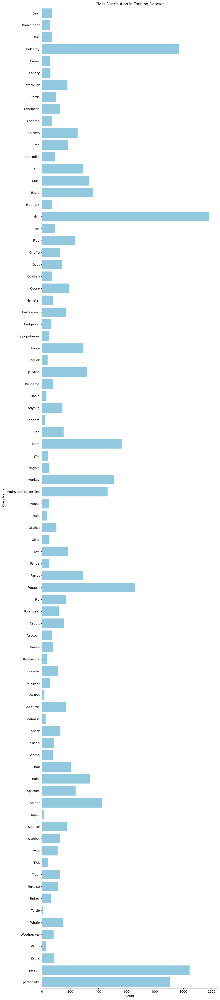

In [11]:
import os
from collections import Counter
import matplotlib.pyplot as plt
import seaborn as sns

# Provided order of classes (as given)
ordered_classes = [
    'Bear', 'Brown-bear', 'Bull', 'Butterfly', 'Camel', 'Canary', 'Caterpillar', 'Cattle',
    'Centipede', 'Cheetah', 'Chicken', 'Crab', 'Crocodile', 'Deer', 'Duck', 'Eagle',
    'Elephant', 'Fish', 'Fox', 'Frog', 'Giraffe', 'Goat', 'Goldfish', 'Goose', 'Hamster',
    'Harbor-seal', 'Hedgehog', 'Hippopotamus', 'Horse', 'Jaguar', 'Jellyfish', 'Kangaroo',
    'Koala', 'Ladybug', 'Leopard', 'Lion', 'Lizard', 'Lynx', 'Magpie', 'Monkey',
    'Moths-and-butterflies', 'Mouse', 'Mule', 'Ostrich', 'Otter', 'Owl', 'Panda', 'Parrot',
    'Penguin', 'Pig', 'Polar-bear', 'Rabbit', 'Raccoon', 'Raven', 'Red-panda', 'Rhinoceros',
    'Scorpion', 'Sea-lion', 'Sea-turtle', 'Seahorse', 'Shark', 'Sheep', 'Shrimp', 'Snail',
    'Snake', 'Sparrow', 'Spider', 'Squid', 'Squirrel', 'Starfish', 'Swan', 'Tick', 'Tiger',
    'Tortoise', 'Turkey', 'Turtle', 'Whale', 'Woodpecker', 'Worm', 'Zebra', 'person', 'person-like'
]

labels_dir = "/kaggle/input/yolo-dataset/train/labels"
class_counter = Counter()

# Count class occurrences from YOLO label files
for label_file in os.listdir(labels_dir):
    if label_file.endswith(".txt"):
        with open(os.path.join(labels_dir, label_file), 'r') as f:
            for line in f:
                parts = line.strip().split()
                if parts:
                    cls_id = int(parts[0])
                    class_counter[cls_id] += 1

# Convert to an ordered list of counts based on the class list
ordered_counts = [class_counter[i] for i in range(len(ordered_classes))]

# Plot a horizontal bar chart
plt.figure(figsize=(10, 45))  # Increase height to fit all classes
y_positions = range(len(ordered_classes))
sns.barplot(x=ordered_counts, y=ordered_classes, orient='h', color='skyblue')
plt.title("Class Distribution in Training Dataset")
plt.xlabel("Count")
plt.ylabel("Class Name")
plt.tight_layout()
plt.show()


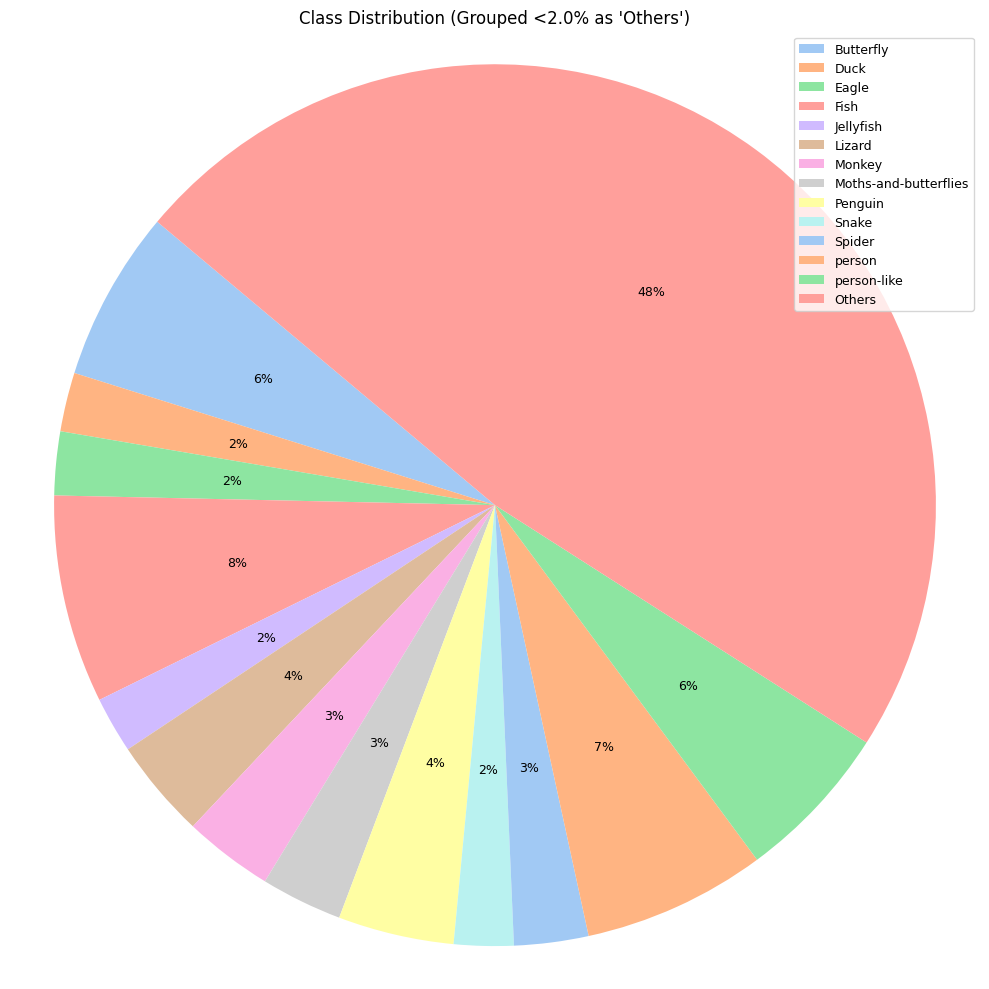

In [12]:
import os
from collections import Counter
import matplotlib.pyplot as plt
import seaborn as sns

# 1) Define your ordered classes
ordered_classes = [
    'Bear', 'Brown-bear', 'Bull', 'Butterfly', 'Camel', 'Canary', 'Caterpillar', 'Cattle', 
    'Centipede', 'Cheetah', 'Chicken', 'Crab', 'Crocodile', 'Deer', 'Duck', 'Eagle', 
    'Elephant', 'Fish', 'Fox', 'Frog', 'Giraffe', 'Goat', 'Goldfish', 'Goose', 'Hamster', 
    'Harbor-seal', 'Hedgehog', 'Hippopotamus', 'Horse', 'Jaguar', 'Jellyfish', 'Kangaroo', 
    'Koala', 'Ladybug', 'Leopard', 'Lion', 'Lizard', 'Lynx', 'Magpie', 'Monkey', 
    'Moths-and-butterflies', 'Mouse', 'Mule', 'Ostrich', 'Otter', 'Owl', 'Panda', 'Parrot', 
    'Penguin', 'Pig', 'Polar-bear', 'Rabbit', 'Raccoon', 'Raven', 'Red-panda', 'Rhinoceros', 
    'Scorpion', 'Sea-lion', 'Sea-turtle', 'Seahorse', 'Shark', 'Sheep', 'Shrimp', 'Snail', 
    'Snake', 'Sparrow', 'Spider', 'Squid', 'Squirrel', 'Starfish', 'Swan', 'Tick', 'Tiger', 
    'Tortoise', 'Turkey', 'Turtle', 'Whale', 'Woodpecker', 'Worm', 'Zebra', 'person', 'person-like'
]

# 2) Specify where your YOLO label files are stored
labels_dir = "/kaggle/input/yolo-dataset/train/labels"

# 3) Count class occurrences from label files
class_counter = Counter()
for label_file in os.listdir(labels_dir):
    if label_file.endswith(".txt"):
        with open(os.path.join(labels_dir, label_file), 'r') as f:
            for line in f:
                parts = line.strip().split()
                if parts:
                    cls_id = int(parts[0])
                    class_counter[cls_id] += 1

# 4) Convert to an ordered list of counts (assuming class indices match ordered_classes)
ordered_counts = [class_counter[i] for i in range(len(ordered_classes))]

# 5) Filter out classes that have zero counts (optional, so they don't appear at all)
filtered_classes = []
filtered_counts = []
for cls_name, count in zip(ordered_classes, ordered_counts):
    if count > 0:
        filtered_classes.append(cls_name)
        filtered_counts.append(count)

# 6) Group classes below a certain percentage threshold into "Others"
threshold_percent = 2.0  # e.g. classes < 2% of total get lumped into "Others"
total_count = sum(filtered_counts)
threshold = (threshold_percent / 100.0) * total_count

major_classes = []
major_counts = []
others_count = 0

for cls_name, count in zip(filtered_classes, filtered_counts):
    if count < threshold:
        others_count += count
    else:
        major_classes.append(cls_name)
        major_counts.append(count)

# If there's any "Others" count, add it as a slice
if others_count > 0:
    major_classes.append("Others")
    major_counts.append(others_count)

# 7) Plot the single pie chart
plt.figure(figsize=(10, 10))
patches, texts, autotexts = plt.pie(
    major_counts,
    autopct='%1.0f%%',
    colors=sns.color_palette("pastel"),
    textprops={'fontsize': 9},  # smaller font for clarity
    startangle=140
)
plt.legend(patches, major_classes, loc="best", fontsize=9)
plt.axis('equal')
plt.title(f"Class Distribution (Grouped <{threshold_percent}% as 'Others')")
plt.tight_layout()
plt.show()


In [9]:
data_yaml = """train: /kaggle/input/yolo-dataset/train
val: /kaggle/input/yolo-dataset/valid
test: /kaggle/input/yolo-dataset/test

nc: 82
names: ['Bear', 'Brown-bear', 'Bull', 'Butterfly', 'Camel', 'Canary', 'Caterpillar', 'Cattle', 'Centipede', 'Cheetah', 'Chicken', 'Crab', 'Crocodile', 'Deer', 'Duck', 'Eagle', 'Elephant', 'Fish', 'Fox', 'Frog', 'Giraffe', 'Goat', 'Goldfish', 'Goose', 'Hamster', 'Harbor-seal', 'Hedgehog', 'Hippopotamus', 'Horse', 'Jaguar', 'Jellyfish', 'Kangaroo', 'Koala', 'Ladybug', 'Leopard', 'Lion', 'Lizard', 'Lynx', 'Magpie', 'Monkey', 'Moths-and-butterflies', 'Mouse', 'Mule', 'Ostrich', 'Otter', 'Owl', 'Panda', 'Parrot', 'Penguin', 'Pig', 'Polar-bear', 'Rabbit', 'Raccoon', 'Raven', 'Red-panda', 'Rhinoceros', 'Scorpion', 'Sea-lion', 'Sea-turtle', 'Seahorse', 'Shark', 'Sheep', 'Shrimp', 'Snail', 'Snake', 'Sparrow', 'Spider', 'Squid', 'Squirrel', 'Starfish', 'Swan', 'Tick', 'Tiger', 'Tortoise', 'Turkey', 'Turtle', 'Whale', 'Woodpecker', 'Worm', 'Zebra', 'person', 'person-like']
"""

# Save the YAML file inside the working directory
yaml_path = "/kaggle/working/data.yaml"
with open(yaml_path, "w") as f:
    f.write(data_yaml)

print(f"data.yaml file saved at: {yaml_path}")

data.yaml file saved at: /kaggle/working/data.yaml


In [10]:
!jupyter notebook --NotebookApp.iopub_msg_rate_limit=100000 > /dev/null 2>&1

In [11]:
# Cell 1: Import Libraries and Load YAML Configuration
import os
import yaml
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt

# Path to your dataset YAML file (update this path accordingly)
yaml_path = "/kaggle/working/data.yaml"  # Replace with your actual YAML file path

# Load the YAML file to get dataset details and class names
with open(yaml_path, "r") as f:
    data = yaml.safe_load(f)

# Retrieve the class names (order matters!)
class_names = data.get("names", [])
print(f"Loaded {len(class_names)} classes:")
print(class_names)


Loaded 82 classes:
['Bear', 'Brown-bear', 'Bull', 'Butterfly', 'Camel', 'Canary', 'Caterpillar', 'Cattle', 'Centipede', 'Cheetah', 'Chicken', 'Crab', 'Crocodile', 'Deer', 'Duck', 'Eagle', 'Elephant', 'Fish', 'Fox', 'Frog', 'Giraffe', 'Goat', 'Goldfish', 'Goose', 'Hamster', 'Harbor-seal', 'Hedgehog', 'Hippopotamus', 'Horse', 'Jaguar', 'Jellyfish', 'Kangaroo', 'Koala', 'Ladybug', 'Leopard', 'Lion', 'Lizard', 'Lynx', 'Magpie', 'Monkey', 'Moths-and-butterflies', 'Mouse', 'Mule', 'Ostrich', 'Otter', 'Owl', 'Panda', 'Parrot', 'Penguin', 'Pig', 'Polar-bear', 'Rabbit', 'Raccoon', 'Raven', 'Red-panda', 'Rhinoceros', 'Scorpion', 'Sea-lion', 'Sea-turtle', 'Seahorse', 'Shark', 'Sheep', 'Shrimp', 'Snail', 'Snake', 'Sparrow', 'Spider', 'Squid', 'Squirrel', 'Starfish', 'Swan', 'Tick', 'Tiger', 'Tortoise', 'Turkey', 'Turtle', 'Whale', 'Woodpecker', 'Worm', 'Zebra', 'person', 'person-like']


In [13]:
# Install/update ultralytics if not already done
!pip install ultralytics --upgrade -q

from ultralytics import YOLO

# Define hyperparameters and dataset path
yaml_path = "data.yaml"  # Ensure this YAML file has correct paths and class names

# Hyperparameters (default values; adjust these as needed)
lr0 = 0.01             # Initial learning rate
lrf = 0.01             # Final learning rate (lr0 * lrf is the minimum lr)
momentum = 0.937
weight_decay = 0.0005
warmup_epochs = 3.0
warmup_momentum = 0.8
warmup_bias_lr = 0.1
box = 7.5              # Box loss gain
cls = 0.5              # Class loss gain
kobj = 1.0             # Objectness loss gain
iou = 0.20             # IoU threshold for loss
hsv_h = 0.015
hsv_s = 0.7
hsv_v = 0.4
degrees = 0.0
translate = 0.1
scale = 0.5
shear = 0.0
perspective = 0.0
flipud = 0.0
fliplr = 0.5
mosaic = 1.0
mixup = 0.0
early_stop_patience = 100  # Early stopping patience

# Load the base YOLOv8 model (YOLOv8n is used here; choose another variant if desired)
model = YOLO("yolov8n.pt")

# Train the model for 60 epochs
results = model.train(
    data=yaml_path,         # Path to your data.yaml file
    epochs=100,              # Train for 60 epochs
    imgsz=640,              # Input image size
    batch=32,               # Batch size (adjust based on your hardware)
    device="cuda:0",        # Use GPU (change to "cpu" if necessary)
    augment=True,           # Enable data augmentation
    lr0=lr0,
    lrf=lrf,
    momentum=momentum,
    weight_decay=weight_decay,
    warmup_epochs=warmup_epochs,
    warmup_momentum=warmup_momentum,
    warmup_bias_lr=warmup_bias_lr,
    box=box,
    cls=cls,
    kobj=kobj,
    iou=iou,
    hsv_h=hsv_h,
    hsv_s=hsv_s,
    hsv_v=hsv_v,
    degrees=degrees,
    translate=translate,
    scale=scale,
    shear=shear,
    perspective=perspective,
    flipud=flipud,
    fliplr=fliplr,
    mosaic=mosaic,
    mixup=mixup,
    patience=early_stop_patience
)

print("Training completed!")


Ultralytics 8.3.96 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=data.yaml, epochs=100, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=cuda:0, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.2, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=True, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=T

train: Scanning /kaggle/input/yolo-dataset/train/labels... 11981 images, 38 backgrounds, 0 corrupt: 100%|██████████| 11981/11981 [00:14<00:00, 847.85it/s]

train: WARNING ⚠️ /kaggle/input/yolo-dataset/train/images/326b9a3496142b2e_jpg.rf.7b98142ac3d6c02d927a58789bbe03b8.jpg: 1 duplicate labels removed


train: WARNING ⚠️ Cache directory /kaggle/input/yolo-dataset/train is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /kaggle/input/yolo-dataset/valid/labels... 3347 images, 0 backgrounds, 0 corrupt: 100%|██████████| 3347/3347 [00:03<00:00, 900.63it/s]


val: WARNING ⚠️ Cache directory /kaggle/input/yolo-dataset/valid is not writeable, cache not saved.
Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train2
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100       7.7G     0.8916      4.368      1.328         45        640: 100%|██████████| 375/375 [02:15<00:00,  2.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:18<00:00,  2.91it/s]


                   all       3347       4318      0.565      0.129      0.076     0.0519

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      7.71G      1.025        3.4      1.404         41        640: 100%|██████████| 375/375 [02:11<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:18<00:00,  2.84it/s]


                   all       3347       4318       0.34      0.172       0.11     0.0717

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      7.71G      1.103      3.232       1.46         36        640: 100%|██████████| 375/375 [02:10<00:00,  2.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:18<00:00,  2.81it/s]


                   all       3347       4318      0.227     0.0903     0.0358     0.0192

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      7.71G      1.207      3.266      1.522         35        640: 100%|██████████| 375/375 [02:09<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:18<00:00,  2.80it/s]


                   all       3347       4318       0.31      0.184      0.116     0.0679

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      7.71G      1.156      2.976      1.476         42        640: 100%|██████████| 375/375 [02:09<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:18<00:00,  2.83it/s]


                   all       3347       4318      0.336      0.253      0.183      0.121

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      7.71G      1.119      2.743      1.444         30        640: 100%|██████████| 375/375 [02:10<00:00,  2.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:18<00:00,  2.88it/s]


                   all       3347       4318      0.449      0.286      0.243      0.161

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      7.71G       1.09      2.548      1.421         31        640: 100%|██████████| 375/375 [02:09<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:18<00:00,  2.91it/s]


                   all       3347       4318      0.386      0.289      0.212      0.137

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      7.71G       1.07      2.395      1.407         40        640: 100%|██████████| 375/375 [02:09<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:18<00:00,  2.86it/s]


                   all       3347       4318      0.424      0.347      0.303       0.21

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      7.71G      1.048       2.29      1.391         29        640: 100%|██████████| 375/375 [02:09<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:18<00:00,  2.91it/s]


                   all       3347       4318      0.436        0.4      0.348      0.243

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      7.71G      1.044      2.205      1.385         88        640: 100%|██████████| 375/375 [02:10<00:00,  2.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:18<00:00,  2.91it/s]


                   all       3347       4318      0.471       0.35      0.327      0.228

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      7.71G       1.03      2.135      1.368         53        640: 100%|██████████| 375/375 [02:09<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:17<00:00,  2.98it/s]


                   all       3347       4318      0.472      0.404      0.391      0.279

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      7.71G      1.013       2.07      1.357         36        640: 100%|██████████| 375/375 [02:09<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:18<00:00,  2.91it/s]


                   all       3347       4318      0.549      0.407      0.405      0.286

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      7.71G     0.9956       2.01      1.348         38        640: 100%|██████████| 375/375 [02:10<00:00,  2.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:18<00:00,  2.93it/s]


                   all       3347       4318      0.482      0.453      0.436      0.316

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      7.71G     0.9868      1.955      1.343         44        640: 100%|██████████| 375/375 [02:11<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:18<00:00,  2.88it/s]


                   all       3347       4318      0.509      0.421      0.433       0.32

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      7.71G     0.9718      1.897      1.336         36        640: 100%|██████████| 375/375 [02:09<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:17<00:00,  2.96it/s]


                   all       3347       4318      0.589      0.418       0.45      0.334

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      7.71G     0.9508      1.855      1.319         51        640: 100%|██████████| 375/375 [02:09<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:18<00:00,  2.90it/s]


                   all       3347       4318      0.516      0.501      0.488      0.363

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      7.71G     0.9601      1.852      1.325         37        640: 100%|██████████| 375/375 [02:09<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:18<00:00,  2.94it/s]


                   all       3347       4318       0.56      0.472      0.483      0.364

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      7.71G     0.9479      1.783      1.313         30        640: 100%|██████████| 375/375 [02:09<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:17<00:00,  2.98it/s]


                   all       3347       4318      0.519      0.489      0.472      0.353

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      7.71G     0.9322      1.746      1.306         40        640: 100%|██████████| 375/375 [02:09<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:17<00:00,  2.97it/s]


                   all       3347       4318      0.582      0.478       0.51      0.385

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      7.71G     0.9352      1.722      1.306         50        640: 100%|██████████| 375/375 [02:09<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:17<00:00,  3.02it/s]


                   all       3347       4318      0.516      0.507      0.503      0.374

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      7.71G     0.9241      1.686      1.296         39        640: 100%|██████████| 375/375 [02:09<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:17<00:00,  3.00it/s]


                   all       3347       4318      0.544      0.509      0.524      0.397

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      7.71G     0.9195      1.674      1.293         42        640: 100%|██████████| 375/375 [02:09<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:17<00:00,  2.98it/s]


                   all       3347       4318      0.611      0.499      0.536      0.409

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      7.71G     0.9076      1.631      1.287         28        640: 100%|██████████| 375/375 [02:09<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:18<00:00,  2.93it/s]


                   all       3347       4318      0.617      0.507      0.557      0.428

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      7.71G     0.9051      1.614      1.285         39        640: 100%|██████████| 375/375 [02:09<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:18<00:00,  2.91it/s]


                   all       3347       4318      0.612       0.56      0.576      0.438

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      7.71G     0.9025      1.599      1.282         85        640: 100%|██████████| 375/375 [02:09<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:17<00:00,  2.95it/s]


                   all       3347       4318      0.577      0.549      0.557      0.427

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      7.71G     0.8944      1.568      1.269         37        640: 100%|██████████| 375/375 [02:09<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:18<00:00,  2.92it/s]


                   all       3347       4318      0.637      0.544      0.587      0.451

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      7.71G     0.8897      1.565      1.275         37        640: 100%|██████████| 375/375 [02:09<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:17<00:00,  2.96it/s]


                   all       3347       4318       0.62      0.543      0.581      0.444

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      7.71G     0.8805      1.512      1.266         35        640: 100%|██████████| 375/375 [02:09<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:18<00:00,  2.89it/s]


                   all       3347       4318      0.619      0.569      0.595      0.458

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      7.71G     0.8872      1.502      1.265         43        640: 100%|██████████| 375/375 [02:09<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:17<00:00,  2.97it/s]


                   all       3347       4318      0.599      0.562      0.597      0.463

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      7.71G     0.8761      1.491      1.262         31        640: 100%|██████████| 375/375 [02:09<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:18<00:00,  2.93it/s]


                   all       3347       4318      0.678      0.564      0.622      0.488

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      7.71G      0.869      1.476      1.254         41        640: 100%|██████████| 375/375 [02:09<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:18<00:00,  2.92it/s]


                   all       3347       4318      0.634      0.565      0.609       0.48

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      7.71G     0.8636       1.45      1.253         48        640: 100%|██████████| 375/375 [02:09<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:18<00:00,  2.81it/s]


                   all       3347       4318      0.636      0.598      0.628      0.499

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      7.71G     0.8541      1.438      1.249         46        640: 100%|██████████| 375/375 [02:09<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:18<00:00,  2.92it/s]


                   all       3347       4318      0.646        0.6      0.632      0.495

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      8.35G     0.8565      1.416      1.248         41        640: 100%|██████████| 375/375 [02:09<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:17<00:00,  3.00it/s]


                   all       3347       4318      0.649      0.595      0.633      0.499

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      8.35G     0.8543      1.439       1.25         34        640: 100%|██████████| 375/375 [02:09<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:17<00:00,  2.95it/s]


                   all       3347       4318      0.674      0.592      0.645      0.513

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      8.35G     0.8545      1.383      1.246         37        640: 100%|██████████| 375/375 [02:09<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:17<00:00,  2.97it/s]


                   all       3347       4318      0.673       0.61      0.647      0.513

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      8.35G     0.8459      1.379      1.243         22        640: 100%|██████████| 375/375 [02:09<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:17<00:00,  2.98it/s]


                   all       3347       4318      0.684      0.603      0.655      0.519

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      8.35G     0.8414      1.368       1.24         43        640: 100%|██████████| 375/375 [02:09<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:17<00:00,  2.95it/s]


                   all       3347       4318      0.653      0.637      0.652      0.519

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      8.35G     0.8482      1.372      1.242         28        640: 100%|██████████| 375/375 [02:09<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:17<00:00,  2.98it/s]


                   all       3347       4318       0.71      0.611      0.674      0.538

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      8.35G     0.8411      1.342      1.234         38        640: 100%|██████████| 375/375 [02:09<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:17<00:00,  2.95it/s]


                   all       3347       4318      0.662      0.636      0.671      0.537

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      8.35G      0.835      1.334      1.233         27        640: 100%|██████████| 375/375 [02:09<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:18<00:00,  2.94it/s]


                   all       3347       4318      0.726      0.604      0.675      0.539

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      8.35G     0.8304      1.314      1.226         43        640: 100%|██████████| 375/375 [02:09<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:18<00:00,  2.94it/s]


                   all       3347       4318      0.709      0.606      0.666      0.535

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      8.35G     0.8253      1.289      1.223         33        640: 100%|██████████| 375/375 [02:09<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:18<00:00,  2.87it/s]


                   all       3347       4318      0.715       0.61      0.675      0.544

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      8.35G     0.8215      1.287      1.226         38        640: 100%|██████████| 375/375 [02:09<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:18<00:00,  2.93it/s]


                   all       3347       4318      0.694      0.622      0.672      0.537

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      8.35G     0.8226      1.277      1.225         32        640: 100%|██████████| 375/375 [02:09<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:17<00:00,  2.95it/s]


                   all       3347       4318      0.673      0.632      0.677      0.545

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      8.35G     0.8134       1.27       1.22         43        640: 100%|██████████| 375/375 [02:09<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:18<00:00,  2.93it/s]


                   all       3347       4318      0.685      0.637      0.683      0.552

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      8.35G     0.8098      1.251      1.216         45        640: 100%|██████████| 375/375 [02:09<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:17<00:00,  2.97it/s]


                   all       3347       4318      0.727      0.616      0.688      0.557

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      8.35G     0.8037      1.234       1.21         39        640: 100%|██████████| 375/375 [02:09<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:18<00:00,  2.93it/s]


                   all       3347       4318      0.718      0.625      0.689       0.56

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      8.35G        0.8       1.22      1.212         43        640: 100%|██████████| 375/375 [02:10<00:00,  2.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:19<00:00,  2.76it/s]


                   all       3347       4318      0.712      0.631      0.688      0.559

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      8.35G     0.8064      1.221      1.214         39        640: 100%|██████████| 375/375 [02:13<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:19<00:00,  2.75it/s]


                   all       3347       4318      0.685      0.655      0.694      0.564

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      8.35G     0.7926      1.218      1.209         30        640: 100%|██████████| 375/375 [02:12<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:19<00:00,  2.72it/s]


                   all       3347       4318      0.696      0.657      0.701       0.57

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      8.35G     0.7935      1.195      1.207         34        640: 100%|██████████| 375/375 [02:12<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:19<00:00,  2.74it/s]


                   all       3347       4318      0.702      0.652      0.698      0.565

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      8.35G     0.7934      1.188      1.203         45        640: 100%|██████████| 375/375 [02:12<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:19<00:00,  2.66it/s]


                   all       3347       4318      0.702      0.652      0.701      0.568

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      8.35G      0.789      1.171        1.2         37        640: 100%|██████████| 375/375 [02:14<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:20<00:00,  2.65it/s]


                   all       3347       4318      0.707      0.639        0.7      0.568

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      8.35G     0.7924      1.164      1.201         54        640: 100%|██████████| 375/375 [02:13<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:19<00:00,  2.67it/s]


                   all       3347       4318      0.711      0.645      0.702      0.572

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      8.35G     0.7879      1.154      1.201         45        640: 100%|██████████| 375/375 [02:13<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:19<00:00,  2.73it/s]


                   all       3347       4318      0.711      0.657        0.7      0.571

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      8.35G     0.7812      1.142      1.191         29        640: 100%|██████████| 375/375 [02:14<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:19<00:00,  2.66it/s]


                   all       3347       4318      0.739      0.631      0.701      0.574

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      8.35G     0.7762      1.146      1.196         39        640: 100%|██████████| 375/375 [02:12<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:20<00:00,  2.65it/s]


                   all       3347       4318      0.707      0.642      0.699      0.569

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      8.35G     0.7757       1.13      1.193         38        640: 100%|██████████| 375/375 [02:13<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:19<00:00,  2.72it/s]


                   all       3347       4318      0.722      0.635      0.702      0.574

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      8.35G     0.7733      1.121      1.188         39        640: 100%|██████████| 375/375 [02:13<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:19<00:00,  2.65it/s]


                   all       3347       4318      0.728      0.632      0.706       0.58

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      8.35G       0.77      1.118      1.189         44        640: 100%|██████████| 375/375 [02:13<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:19<00:00,  2.68it/s]


                   all       3347       4318      0.721      0.637      0.707      0.582

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      8.35G     0.7661      1.105      1.186         36        640: 100%|██████████| 375/375 [02:11<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:19<00:00,  2.78it/s]


                   all       3347       4318      0.716      0.641      0.707      0.582

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      8.35G     0.7554      1.082       1.18         44        640: 100%|██████████| 375/375 [02:12<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:19<00:00,  2.73it/s]


                   all       3347       4318       0.72      0.646       0.71      0.584

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      8.35G     0.7637      1.076      1.181         41        640: 100%|██████████| 375/375 [02:13<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:20<00:00,  2.59it/s]


                   all       3347       4318      0.732      0.633      0.707      0.583

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      8.35G     0.7532      1.071      1.176         45        640: 100%|██████████| 375/375 [02:15<00:00,  2.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:20<00:00,  2.57it/s]


                   all       3347       4318      0.737      0.644       0.71      0.585

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      8.35G     0.7587      1.065      1.177        109        640: 100%|██████████| 375/375 [02:15<00:00,  2.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:19<00:00,  2.70it/s]


                   all       3347       4318      0.719      0.648      0.711      0.587

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      8.35G     0.7508      1.046      1.172         38        640: 100%|██████████| 375/375 [02:14<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:20<00:00,  2.60it/s]


                   all       3347       4318      0.748      0.633       0.71      0.586

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      8.35G     0.7484      1.037      1.174         37        640: 100%|██████████| 375/375 [02:16<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:20<00:00,  2.54it/s]


                   all       3347       4318      0.689      0.672       0.71      0.586

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      8.35G     0.7424      1.035      1.172         47        640: 100%|██████████| 375/375 [02:16<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:20<00:00,  2.55it/s]


                   all       3347       4318      0.733       0.66      0.712      0.586

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      8.35G     0.7401      1.012      1.166         42        640: 100%|██████████| 375/375 [02:16<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:20<00:00,  2.60it/s]


                   all       3347       4318      0.746      0.649      0.713      0.586

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      8.35G     0.7334      1.012      1.164         36        640: 100%|██████████| 375/375 [02:15<00:00,  2.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:19<00:00,  2.65it/s]


                   all       3347       4318      0.752      0.641      0.715      0.587

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      8.35G     0.7411      1.002      1.167         45        640: 100%|██████████| 375/375 [02:15<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:20<00:00,  2.63it/s]


                   all       3347       4318      0.732      0.653      0.715      0.588

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      8.35G     0.7321      1.001      1.167         43        640: 100%|██████████| 375/375 [02:14<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:20<00:00,  2.62it/s]


                   all       3347       4318      0.743      0.648      0.716      0.588

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      8.35G     0.7286      1.004      1.166         25        640: 100%|██████████| 375/375 [02:14<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:19<00:00,  2.66it/s]


                   all       3347       4318      0.726      0.657      0.715      0.588

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      8.35G     0.7238     0.9916      1.157         35        640: 100%|██████████| 375/375 [02:13<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:19<00:00,  2.72it/s]


                   all       3347       4318      0.717      0.654      0.713      0.587

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      8.35G      0.721     0.9754      1.159         47        640: 100%|██████████| 375/375 [02:13<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:19<00:00,  2.69it/s]


                   all       3347       4318      0.708      0.663      0.715      0.589

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      8.35G     0.7219     0.9674      1.156         33        640: 100%|██████████| 375/375 [02:14<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:20<00:00,  2.58it/s]


                   all       3347       4318      0.709      0.665      0.715      0.589

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      8.35G     0.7192     0.9514      1.152         38        640: 100%|██████████| 375/375 [02:15<00:00,  2.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:19<00:00,  2.67it/s]


                   all       3347       4318      0.717       0.66      0.713      0.586

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      8.35G     0.7129     0.9421      1.151         50        640: 100%|██████████| 375/375 [02:15<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:19<00:00,  2.69it/s]


                   all       3347       4318      0.738      0.646      0.713      0.587

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      8.35G     0.7145     0.9436      1.153         35        640: 100%|██████████| 375/375 [02:14<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:20<00:00,  2.62it/s]


                   all       3347       4318      0.723      0.648      0.713      0.588

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      8.35G      0.713     0.9397      1.151         47        640: 100%|██████████| 375/375 [02:13<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:19<00:00,  2.69it/s]


                   all       3347       4318      0.718      0.651      0.713      0.588

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      8.35G     0.7085     0.9307      1.146         49        640: 100%|██████████| 375/375 [02:13<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:19<00:00,  2.74it/s]


                   all       3347       4318      0.707      0.653       0.71      0.587

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      8.35G     0.6986     0.9155      1.142         39        640: 100%|██████████| 375/375 [02:15<00:00,  2.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:20<00:00,  2.56it/s]


                   all       3347       4318      0.711      0.651       0.71      0.587

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      8.35G      0.696     0.9005      1.142         35        640: 100%|██████████| 375/375 [02:16<00:00,  2.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:19<00:00,  2.66it/s]


                   all       3347       4318      0.717      0.648       0.71      0.586

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      8.35G     0.6904     0.8944       1.14         48        640: 100%|██████████| 375/375 [02:14<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:19<00:00,  2.68it/s]


                   all       3347       4318      0.714      0.648       0.71      0.586

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      8.35G     0.6985     0.9007      1.142         43        640: 100%|██████████| 375/375 [02:14<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:19<00:00,  2.71it/s]


                   all       3347       4318      0.717      0.647      0.711      0.586

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      8.35G     0.6868     0.8859      1.137         42        640: 100%|██████████| 375/375 [02:13<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:19<00:00,  2.71it/s]


                   all       3347       4318      0.724       0.64       0.71      0.586

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      8.35G     0.6877     0.8719      1.135         32        640: 100%|██████████| 375/375 [02:12<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:19<00:00,  2.71it/s]


                   all       3347       4318      0.719      0.642       0.71      0.586

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      8.35G      0.681     0.8643      1.132         55        640: 100%|██████████| 375/375 [02:11<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:18<00:00,  2.80it/s]


                   all       3347       4318       0.71      0.647       0.71      0.586

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      8.35G      0.683     0.8638      1.133         40        640: 100%|██████████| 375/375 [02:10<00:00,  2.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:18<00:00,  2.80it/s]


                   all       3347       4318      0.708       0.65       0.71      0.587
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      8.35G     0.5727     0.5693      1.074         13        640: 100%|██████████| 375/375 [02:11<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:19<00:00,  2.66it/s]


                   all       3347       4318      0.697      0.663       0.71      0.586

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      8.35G     0.5618     0.5268      1.064         19        640: 100%|██████████| 375/375 [02:12<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:19<00:00,  2.68it/s]


                   all       3347       4318        0.7       0.66       0.71      0.586

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      8.35G     0.5548     0.5095      1.062         15        640: 100%|██████████| 375/375 [02:11<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:19<00:00,  2.67it/s]


                   all       3347       4318        0.7      0.661      0.709      0.586

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      8.35G     0.5442     0.4931      1.053         18        640: 100%|██████████| 375/375 [02:11<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:19<00:00,  2.76it/s]


                   all       3347       4318      0.699      0.662      0.709      0.586

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      8.35G     0.5394     0.4823      1.046         14        640: 100%|██████████| 375/375 [02:10<00:00,  2.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:19<00:00,  2.70it/s]


                   all       3347       4318      0.699       0.66      0.709      0.585

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      8.35G     0.5356     0.4792      1.045         13        640: 100%|██████████| 375/375 [02:12<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:20<00:00,  2.63it/s]


                   all       3347       4318      0.698      0.662      0.708      0.586

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      8.35G     0.5277     0.4654      1.039         18        640: 100%|██████████| 375/375 [02:11<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:19<00:00,  2.67it/s]


                   all       3347       4318      0.694      0.664      0.708      0.586

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      8.35G     0.5286      0.466      1.041         15        640: 100%|██████████| 375/375 [02:10<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:19<00:00,  2.76it/s]


                   all       3347       4318      0.699      0.662      0.708      0.586

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      8.35G     0.5217     0.4533      1.035         21        640: 100%|██████████| 375/375 [02:10<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:19<00:00,  2.67it/s]


                   all       3347       4318        0.7      0.662      0.708      0.586

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      8.35G     0.5198     0.4473      1.032         16        640: 100%|██████████| 375/375 [02:11<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:19<00:00,  2.67it/s]


                   all       3347       4318        0.7      0.661      0.708      0.586

100 epochs completed in 4.200 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 6.6MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 6.6MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics 8.3.96 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Model summary (fused): 72 layers, 3,169,706 parameters, 0 gradients, 8.8 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 53/53 [00:29<00:00,  1.82it/s]


                   all       3347       4318      0.715      0.675       0.72      0.605
                  Bear         12         13      0.321      0.615      0.317      0.284
            Brown-bear         21         22      0.679      0.672        0.8      0.768
                  Bull         24         34      0.581      0.449      0.554      0.466
             Butterfly        218        353      0.836       0.87      0.889      0.588
                 Camel          7          7      0.425      0.714      0.602      0.547
                Canary         18         18      0.699      0.646      0.651      0.519
           Caterpillar         54         55      0.834      0.638       0.75      0.567
                Cattle         42         51      0.512      0.227      0.396      0.348
             Centipede         27         27        0.7      0.852      0.829      0.608
               Cheetah         30         31      0.729      0.677      0.812      0.761
               Chicke

/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.1ms preprocess, 4.4ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to runs/detect/train2
Training completed!


In [17]:
# Run validation
metrics = model.val()
print(metrics)

Ultralytics 8.3.96 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Model summary (fused): 72 layers, 3,169,706 parameters, 0 gradients, 8.8 GFLOPs


val: Scanning /kaggle/input/yolo-dataset/valid/labels... 3347 images, 0 backgrounds, 0 corrupt: 100%|██████████| 3347/3347 [00:04<00:00, 836.38it/s]


val: WARNING ⚠️ Cache directory /kaggle/input/yolo-dataset/valid is not writeable, cache not saved.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:29<00:00,  3.59it/s]


                   all       3347       4318      0.722       0.67      0.718      0.603
                  Bear         12         13      0.343      0.615      0.339      0.304
            Brown-bear         21         22      0.668      0.642      0.798      0.766
                  Bull         24         34      0.575      0.441      0.542      0.458
             Butterfly        218        353      0.837      0.873      0.896       0.59
                 Camel          7          7      0.468      0.714      0.602      0.547
                Canary         18         18      0.712      0.686       0.65       0.51
           Caterpillar         54         55      0.838      0.636      0.754      0.566
                Cattle         42         51      0.501      0.217      0.397      0.347
             Centipede         27         27      0.715      0.852      0.829      0.608
               Cheetah         30         31      0.733      0.677      0.818      0.751
               Chicke

/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.2ms preprocess, 4.5ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to runs/detect/train22
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77,
       78, 79, 80, 81])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7f24e89aa2f0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.

In [18]:
# Save the trained model weights
saved_model_path = "/kaggle/working/best_model.pt"
model.export(format="torchscript")  # Save in TorchScript format
model.save(saved_model_path)  # Save the trained model

print(f"Trained model saved at: {saved_model_path}")

Ultralytics 8.3.96 🚀 Python-3.10.12 torch-2.5.1+cu121 CPU (Intel Xeon 2.00GHz)

PyTorch: starting from 'runs/detect/train2/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 86, 8400) (6.3 MB)

TorchScript: starting export with torch 2.5.1+cu121...
TorchScript: export success ✅ 2.1s, saved as 'runs/detect/train2/weights/best.torchscript' (12.5 MB)

Export complete (2.4s)
Results saved to /kaggle/working/runs/detect/train2/weights
Predict:         yolo predict task=detect model=runs/detect/train2/weights/best.torchscript imgsz=640  
Validate:        yolo val task=detect model=runs/detect/train2/weights/best.torchscript imgsz=640 data=data.yaml  
Visualize:       https://netron.app
Trained model saved at: /kaggle/working/best_model.pt


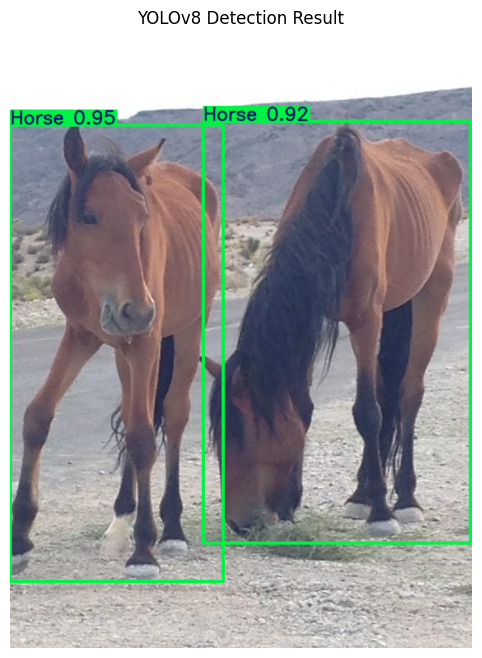

In [20]:
import os
import cv2
import matplotlib.pyplot as plt

# Provide an image path manually for inference
unseen_image_path = "/kaggle/input/yolo-dataset/test/images/0006476c7a10ac38_jpg.rf.3aff95183cfecde484aaeb11aff9cd1b.jpg"  # Replace with your actual image path

if os.path.exists(unseen_image_path):
    # Run inference without saving
    results_unseen = model.predict(source=unseen_image_path, save=False, conf=0.25, verbose=False)

    # Extract and display the result
    img = results_unseen[0].plot()  # Get the image with detections
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for Matplotlib

    # Show image
    plt.figure(figsize=(8, 8))
    plt.imshow(img)
    plt.axis("off")
    plt.title("YOLOv8 Detection Result")
    plt.show()
else:
    print(f"Unseen image not found at: {unseen_image_path}")

Taxonomy CSV preview:


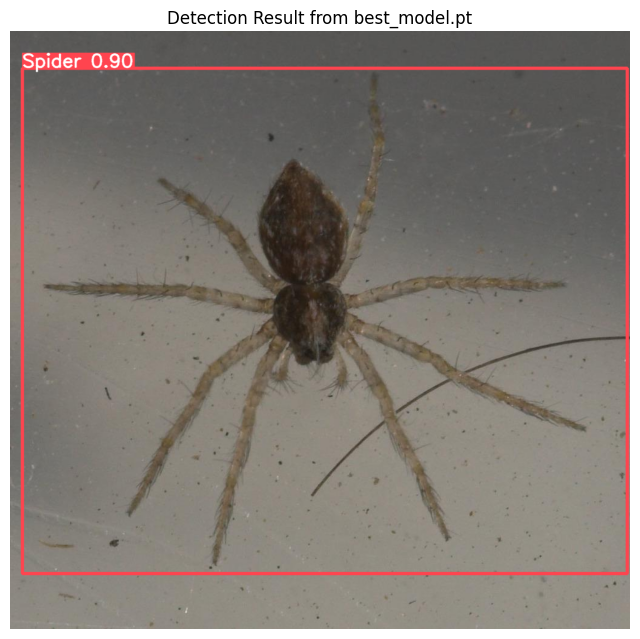

Detected class names: ['Spider']

--- Taxonomy details for 'Spider' ---
Animal: Spider
Class: Arachnid
Population: 562118
Weight: 1321.06 kg
Length: 10.80 feet
Height: 6.36 feet
Habitats: Forests
Status: Critically Endangered
Country: USA
Places: Yellowstone National Park; Urban areas; Arctic Circle
Factor: Human-wildlife conflict
Measures Taken: Anti-poaching patrols


In [21]:
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from ultralytics import YOLO

############################################
# 1) Load the Taxonomy CSV File
############################################
taxonomy_csv_path = "/kaggle/input/taxonmy-details/one_record_per_animal.csv"
taxonomy_df = pd.read_csv(taxonomy_csv_path)
print("Taxonomy CSV preview:")
# print(taxonomy_df.head())

############################################
# 2) Define the Function to Display Taxonomy Details
############################################
def show_taxonomy(animal_name):
    """
    Look up the row in taxonomy_df where 'Animal' matches 'animal_name'
    (case-insensitive), then print all taxonomy details.
    """
    record = taxonomy_df[taxonomy_df['Animal'].str.lower() == animal_name.lower()]
    if record.empty:
        print(f"No taxonomy details found for '{animal_name}'")
    else:
        row = record.iloc[0]
        print(f"\n--- Taxonomy details for '{animal_name}' ---")
        for col in taxonomy_df.columns:
            print(f"{col}: {row[col]}")

############################################
# 3) Load the Saved YOLO Model
############################################
# Load your saved model weights; ensure the file exists at this location.
saved_model_path = "/kaggle/working/best_model.pt"
model = YOLO(saved_model_path)

############################################
# 4) Run Inference on a Test Image and Display Results
############################################
test_image_path = "/kaggle/input/yolo-dataset/test/images/0e79056dc2acae8f_jpg.rf.71a8ade7741fc848f1c8be58af5135cb.jpg"
if os.path.exists(test_image_path):
    results = model.predict(source=test_image_path, conf=0.25, verbose=False)
    
    # Plot the image with detections
    annotated_img = results[0].plot()
    annotated_img = cv2.cvtColor(annotated_img, cv2.COLOR_BGR2RGB)
    
    plt.figure(figsize=(8, 8))
    plt.imshow(annotated_img)
    plt.axis("off")
    plt.title("Detection Result from best_model.pt")
    plt.show()
    
    # Extract and display detected class names
    if results[0].boxes is not None:
        detected_class_ids = (results[0].boxes.cls.cpu().numpy() 
                                if hasattr(results[0].boxes.cls, "cpu") 
                                else results[0].boxes.cls)
        unique_class_ids = np.unique(detected_class_ids)
        detected_names = [results[0].names[int(cls_id)] for cls_id in unique_class_ids]
        print("Detected class names:", detected_names)
        
        # For each detected animal, show its taxonomy details
        for animal in detected_names:
            show_taxonomy(animal)
else:
    print(f"Test image not found at: {test_image_path}")


Taxonomy CSV preview:


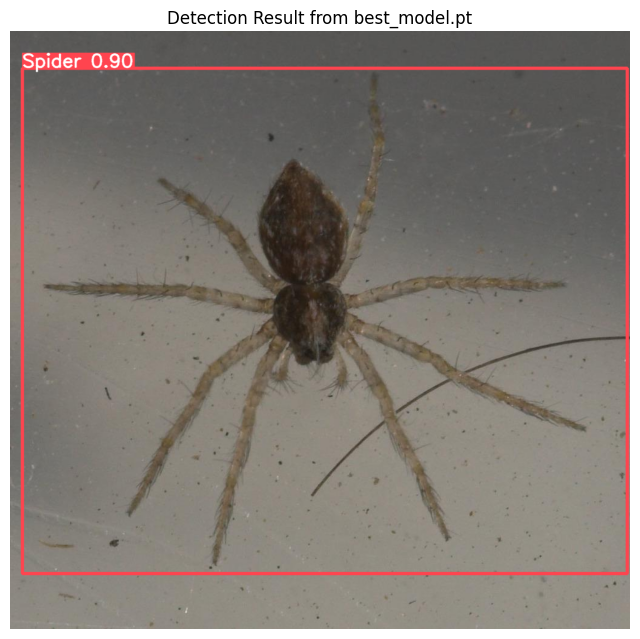

Detected class names: ['Spider']

--- Taxonomy details for 'Spider' ---
Animal: Spider
Class: Arachnid
Population: 562118
Weight: 1321.06 kg
Length: 10.80 feet
Height: 6.36 feet
Habitats: Forests
Status: Critically Endangered
Country: USA
Places: Yellowstone National Park; Urban areas; Arctic Circle
Factor: Human-wildlife conflict
Measures Taken: Anti-poaching patrols


In [22]:
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from ultralytics import YOLO

############################################
# 1) Load the Taxonomy CSV File
############################################
taxonomy_csv_path = "/kaggle/input/taxonmy-details/one_record_per_animal.csv"
taxonomy_df = pd.read_csv(taxonomy_csv_path)
print("Taxonomy CSV preview:")
# print(taxonomy_df.head())

############################################
# 2) Define the Function to Display Taxonomy Details
############################################
def show_taxonomy(animal_name):
    """
    Look up the row in taxonomy_df where 'Animal' matches 'animal_name'
    (case-insensitive), then print all taxonomy details.
    """
    record = taxonomy_df[taxonomy_df['Animal'].str.lower() == animal_name.lower()]
    if record.empty:
        print(f"No taxonomy details found for '{animal_name}'")
    else:
        row = record.iloc[0]
        print(f"\n--- Taxonomy details for '{animal_name}' ---")
        for col in taxonomy_df.columns:
            print(f"{col}: {row[col]}")

############################################
# 3) Load the Saved YOLO Model
############################################
# Load your saved model weights; ensure the file exists at this location.
saved_model_path = "/kaggle/working/best_model.pt"
model = YOLO(saved_model_path)

############################################
# 4) Run Inference on a Test Image and Display Results
############################################
test_image_path = "/kaggle/input/yolo-dataset/test/images/0e79056dc2acae8f_jpg.rf.71a8ade7741fc848f1c8be58af5135cb.jpg"
if os.path.exists(test_image_path):
    results = model.predict(source=test_image_path, conf=0.25, verbose=False)
    
    # Plot the image with detections
    annotated_img = results[0].plot()
    annotated_img = cv2.cvtColor(annotated_img, cv2.COLOR_BGR2RGB)
    
    plt.figure(figsize=(8, 8))
    plt.imshow(annotated_img)
    plt.axis("off")
    plt.title("Detection Result from best_model.pt")
    plt.show()
    
    # Extract and display detected class names
    if results[0].boxes is not None:
        detected_class_ids = (results[0].boxes.cls.cpu().numpy() 
                                if hasattr(results[0].boxes.cls, "cpu") 
                                else results[0].boxes.cls)
        unique_class_ids = np.unique(detected_class_ids)
        detected_names = [results[0].names[int(cls_id)] for cls_id in unique_class_ids]
        print("Detected class names:", detected_names)
        
        # For each detected animal, show its taxonomy details
        for animal in detected_names:
            show_taxonomy(animal)
else:
    print(f"Test image not found at: {test_image_path}")


Taxonomy CSV preview:
Selecting up to 20 images from: /kaggle/input/yolo-dataset/test/images that yield exactly one detected class.

Processing image: de9054c9be69c22a_jpg.rf.65e7473d699b01fc09d4504dcd83efcb.jpg
Detected animal(s): ['Fox']


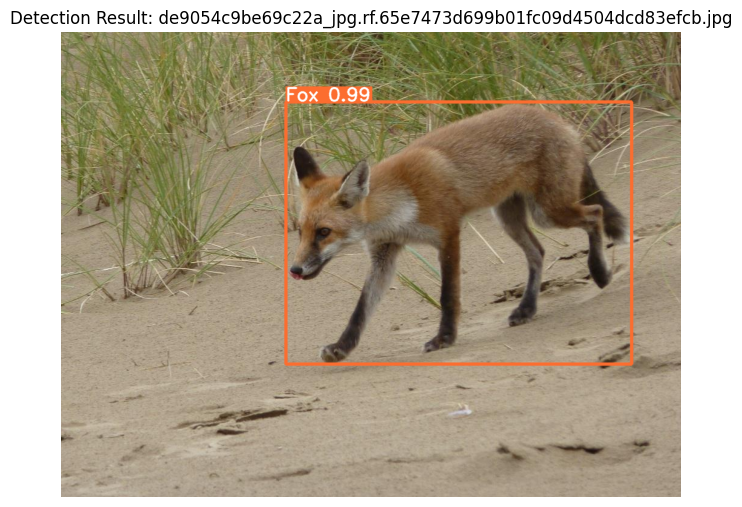


--- Taxonomy details for 'Fox' ---
Animal: Fox
Class: Mammal
Population: 879943
Weight: 4192.84 kg
Length: 28.38 feet
Height: 13.17 feet
Habitats: Mountains
Status: Least Concern
Country: Russia
Places: Urban areas; Sahara Desert; Yellowstone National Park
Factor: Poaching
Measures Taken: Community education
Processing image: c492790c8351a169_jpg.rf.4fc5711569dadbbf8a9c519181e97f6d.jpg
Skipped c492790c8351a169_jpg.rf.4fc5711569dadbbf8a9c519181e97f6d.jpg: Detected 2 classes.

Processing image: 4b3bc7705cb7fe24_jpg.rf.831be8dcc1b986fa43e3206e006f1b38.jpg
Detected animal(s): ['Penguin']


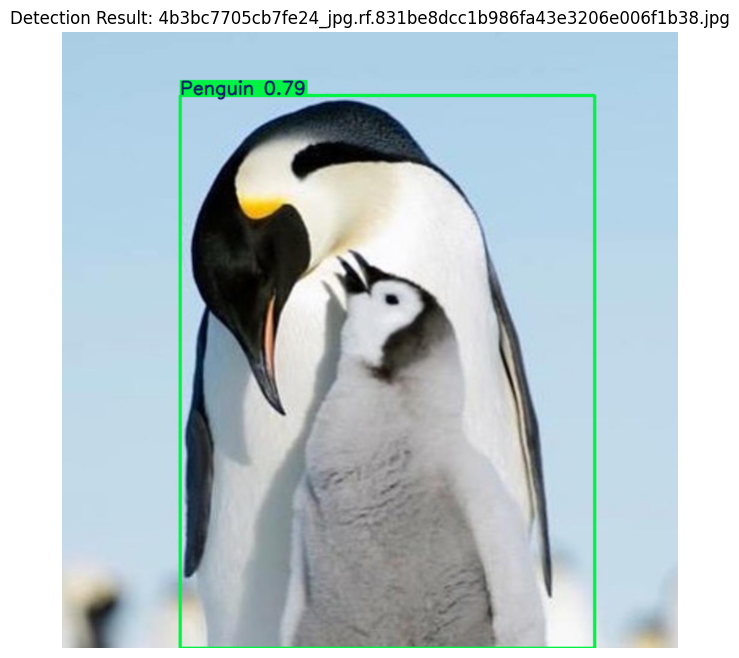


--- Taxonomy details for 'Penguin' ---
Animal: Penguin
Class: Bird
Population: 959035
Weight: 5736.88 kg
Length: 23.32 feet
Height: 17.03 feet
Habitats: Freshwater
Status: Critically Endangered
Country: China
Places: Congo Basin; Great Barrier Reef; Urban areas
Factor: Invasive species
Measures Taken: Habitat restoration
Processing image: image--44-_jpg.rf.20c8882792ee7f08457e61675bab3e63.jpg
Detected animal(s): ['person']


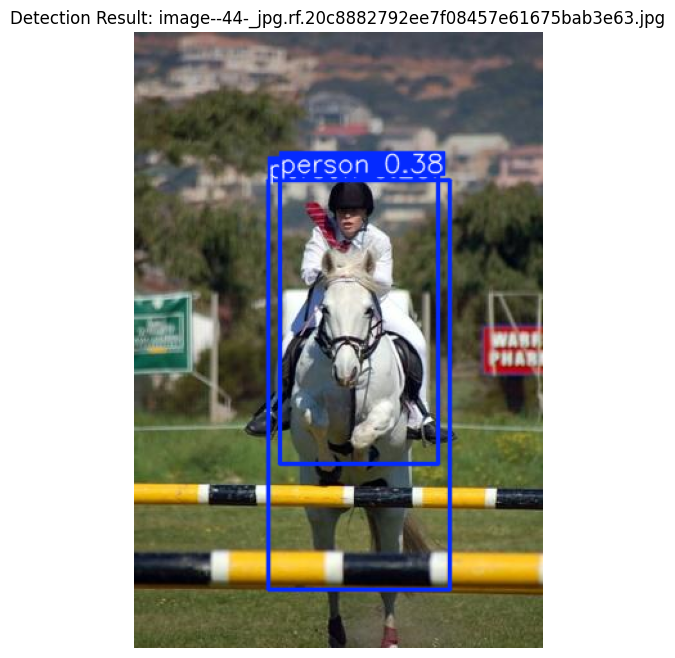


--- Taxonomy details for 'person' ---
Animal: person
Class: Human
Population: 964155
Weight: 3252.92 kg
Length: 10.78 feet
Height: 13.84 feet
Habitats: Ocean
Status: Endangered
Country: Russia
Places: Himalayas; Urban areas; Great Barrier Reef
Factor: Climate change
Measures Taken: Breeding programs
Processing image: 6a8a78365e248b4a_jpg.rf.fc23fd63916ff219d2d00d79a9c9156e.jpg
Skipped 6a8a78365e248b4a_jpg.rf.fc23fd63916ff219d2d00d79a9c9156e.jpg: Detected 2 classes.

Processing image: 340ca14c5044b10d_jpg.rf.94c644b68577abb8993ef0525068f111.jpg
Detected animal(s): ['Butterfly']


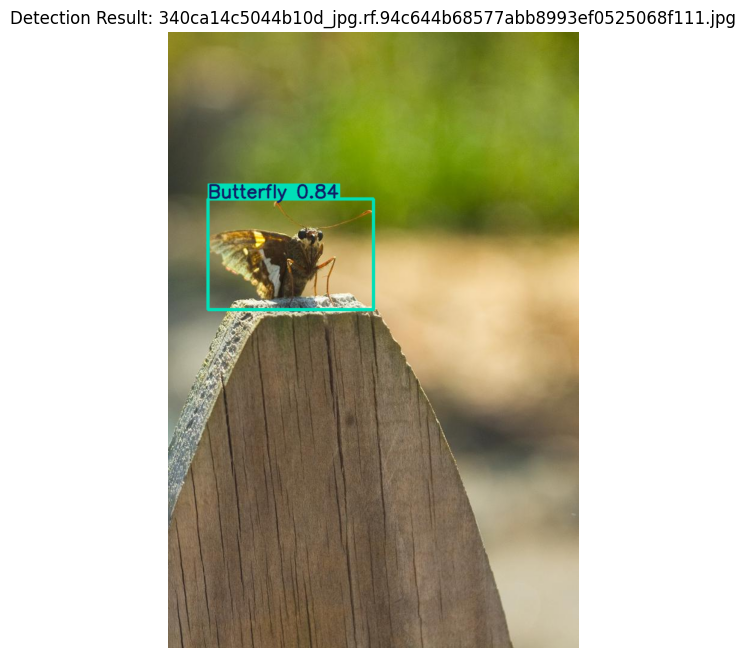


--- Taxonomy details for 'Butterfly' ---
Animal: Butterfly
Class: Insect
Population: 690037
Weight: 778.39 kg
Length: 29.55 feet
Height: 18.73 feet
Habitats: Mountains
Status: Critically Endangered
Country: India
Places: Serengeti; Congo Basin; Yellowstone National Park
Factor: Poaching
Measures Taken: Community education
Processing image: daf8cd626f1de224_jpg.rf.52bb117a6b2696409640ccbf1f8316f2.jpg
Detected animal(s): ['Frog']


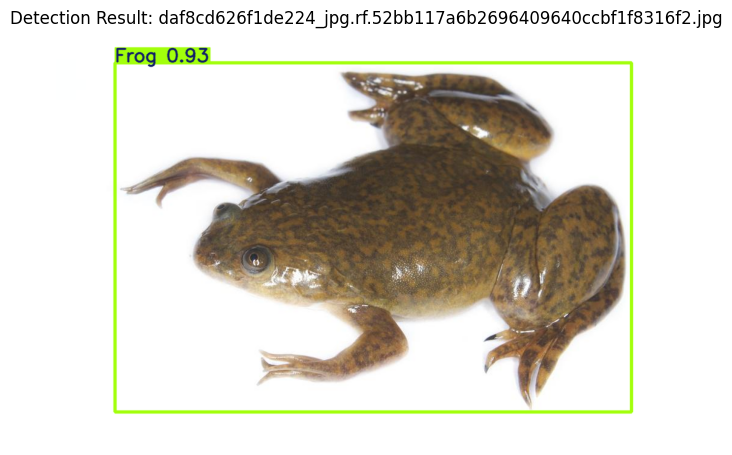


--- Taxonomy details for 'Frog' ---
Animal: Frog
Class: Amphibian
Population: 263480
Weight: 3637.56 kg
Length: 29.62 feet
Height: 5.42 feet
Habitats: Ocean
Status: Near Threatened
Country: Canada
Places: Urban areas; Congo Basin; Great Barrier Reef
Factor: Invasive species
Measures Taken: Breeding programs
Processing image: 33d0166ea034abde_jpg.rf.6dc3bcc3bd4c7b3b17535db1b55249d5.jpg
Detected animal(s): ['Whale']


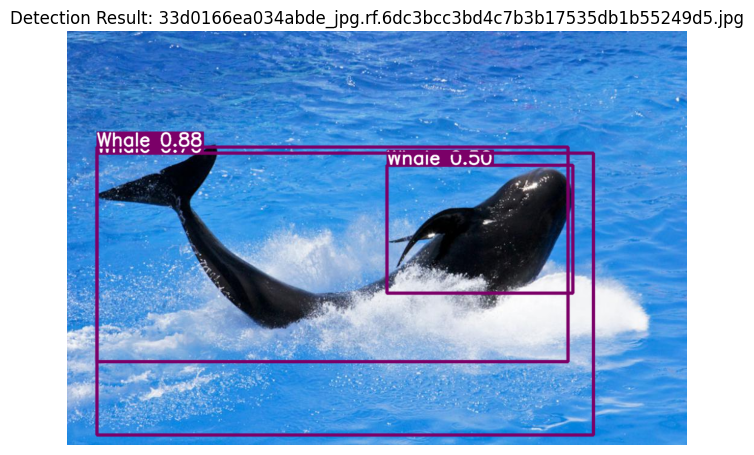


--- Taxonomy details for 'Whale' ---
Animal: Whale
Class: Mammal
Population: 977881
Weight: 737.88 kg
Length: 3.80 feet
Height: 8.62 feet
Habitats: Arctic regions
Status: Near Threatened
Country: South Africa
Places: Urban areas; Serengeti; Yellowstone National Park
Factor: Climate change
Measures Taken: Community education
Processing image: 5bb7f3667873075a_jpg.rf.8614b5d57818f3a0986ed83939bdd430.jpg
Detected animal(s): ['Frog']


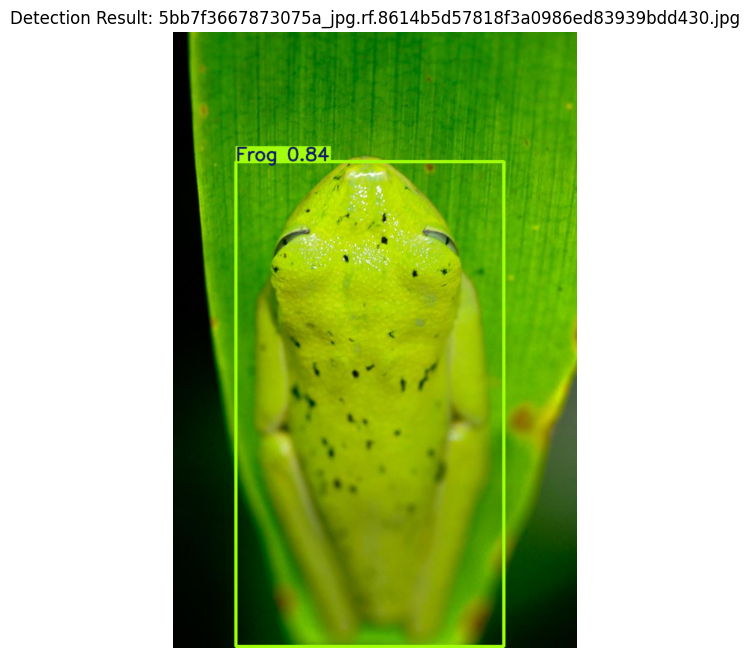


--- Taxonomy details for 'Frog' ---
Animal: Frog
Class: Amphibian
Population: 263480
Weight: 3637.56 kg
Length: 29.62 feet
Height: 5.42 feet
Habitats: Ocean
Status: Near Threatened
Country: Canada
Places: Urban areas; Congo Basin; Great Barrier Reef
Factor: Invasive species
Measures Taken: Breeding programs
Processing image: 55d4c0f21a93583d_jpg.rf.8ab3b5fd86f88b18d2562693fcc12d90.jpg
Detected animal(s): ['Chicken']


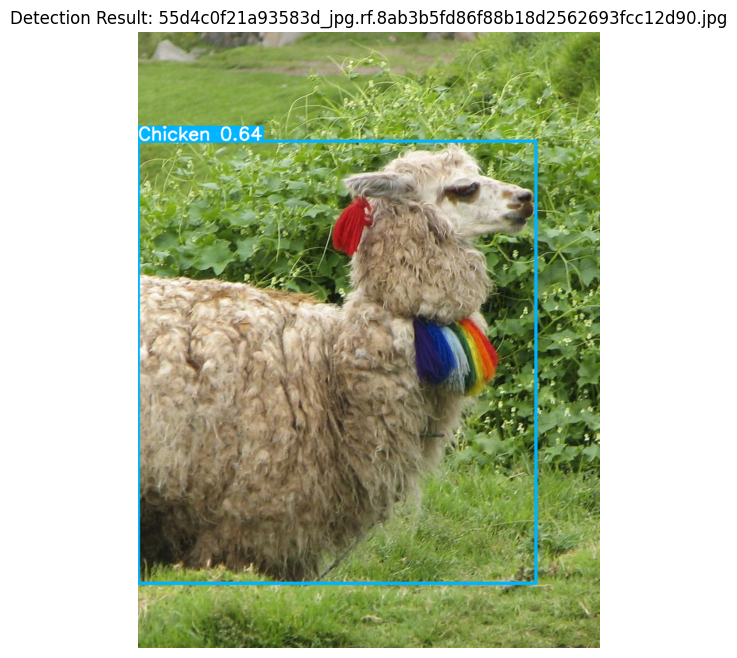


--- Taxonomy details for 'Chicken' ---
Animal: Chicken
Class: Bird
Population: 757010
Weight: 5913.00 kg
Length: 25.56 feet
Height: 10.71 feet
Habitats: Arctic regions
Status: Extinct
Country: USA
Places: Galapagos Islands; Yellowstone National Park; Himalayas
Factor: Pollution
Measures Taken: Conservation programs
Processing image: e3e7fa63c3f4ec1e_jpg.rf.538cbe037ca968cbc905bd4a48e14c62.jpg
Detected animal(s): ['Eagle']


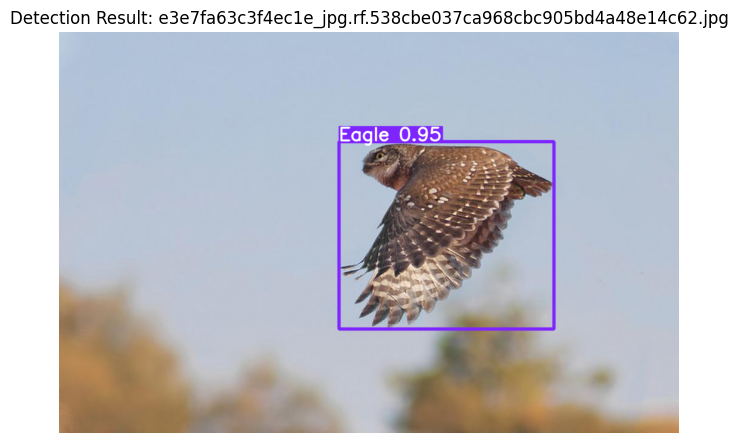


--- Taxonomy details for 'Eagle' ---
Animal: Eagle
Class: Bird
Population: 643773
Weight: 1364.60 kg
Length: 24.46 feet
Height: 19.07 feet
Habitats: Forests
Status: Critically Endangered
Country: Brazil
Places: Serengeti; Yellowstone National Park; Himalayas
Factor: Poaching
Measures Taken: Anti-poaching patrols
Processing image: 4ff73ea2a880da9a_jpg.rf.f7a082aec0066cf60bd6f1810575c8ae.jpg
Detected animal(s): ['Jellyfish']


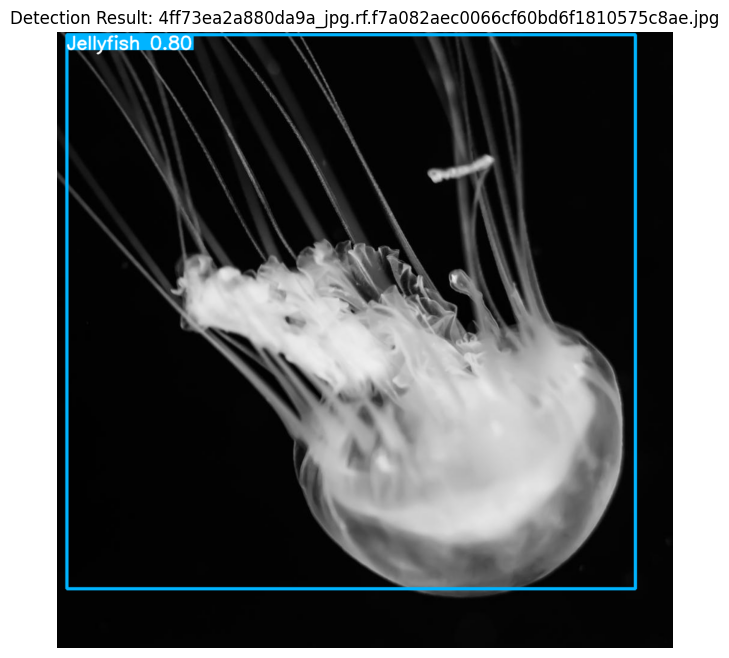


--- Taxonomy details for 'Jellyfish' ---
Animal: Jellyfish
Class: Fish
Population: 978161
Weight: 1370.67 kg
Length: 18.25 feet
Height: 10.64 feet
Habitats: Grasslands
Status: Least Concern
Country: Kenya
Places: Galapagos Islands; Arctic Circle; Congo Basin
Factor: Pollution
Measures Taken: Conservation programs
Processing image: 1c602d3445ab60a7_jpg.rf.8784853b8cb98199e39620880f88f108.jpg
Detected animal(s): ['Monkey']


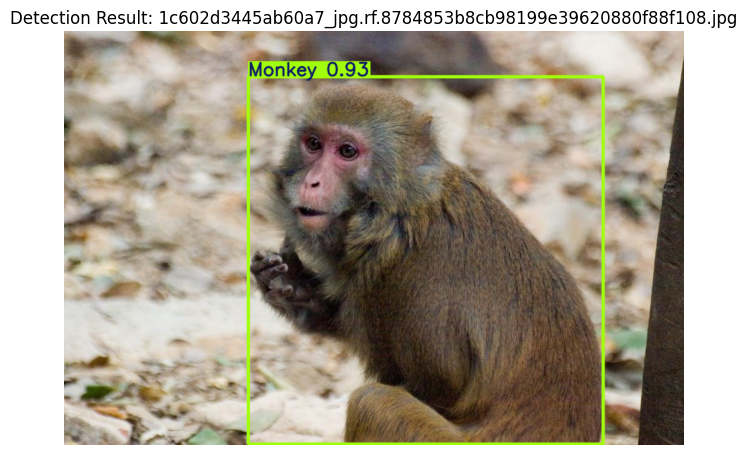


--- Taxonomy details for 'Monkey' ---
Animal: Monkey
Class: Mammal
Population: 546003
Weight: 2026.85 kg
Length: 16.72 feet
Height: 19.35 feet
Habitats: Grasslands
Status: Least Concern
Country: India
Places: Galapagos Islands; Serengeti; Himalayas
Factor: Invasive species
Measures Taken: Conservation programs
Processing image: d9384987d0383554_jpg.rf.b99b4670ffab33f0b1f769e0377ac3db.jpg
Detected animal(s): ['Goose']


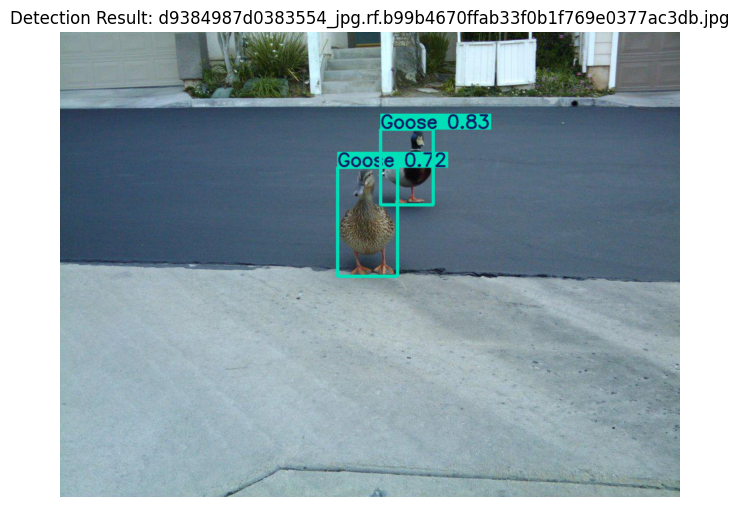


--- Taxonomy details for 'Goose' ---
Animal: Goose
Class: Bird
Population: 516439
Weight: 1117.02 kg
Length: 24.79 feet
Height: 7.09 feet
Habitats: Urban areas
Status: Endangered
Country: China
Places: Arctic Circle; Urban areas; Sahara Desert
Factor: Habitat loss
Measures Taken: Protected areas
Processing image: 99282baf5eefdaa5_jpg.rf.6b4ba31d88b0f9d842af05322dc040cf.jpg
Detected animal(s): ['Ostrich']


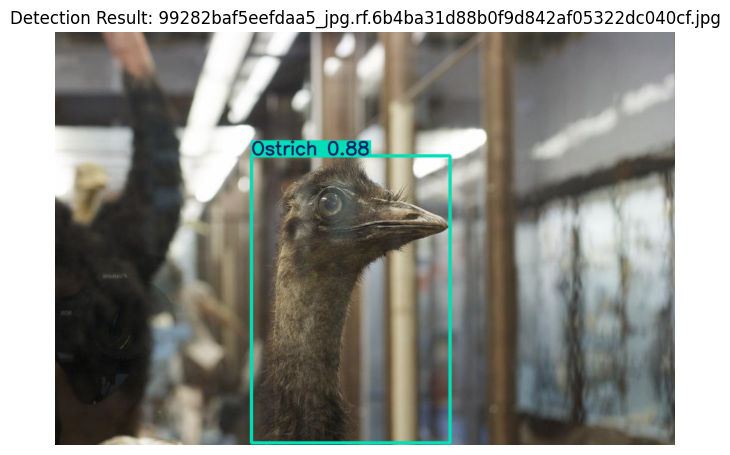


--- Taxonomy details for 'Ostrich' ---
Animal: Ostrich
Class: Bird
Population: 445749
Weight: 4356.00 kg
Length: 9.52 feet
Height: 10.09 feet
Habitats: Mountains
Status: Near Threatened
Country: Australia
Places: Arctic Circle; Great Barrier Reef; Urban areas
Factor: Climate change
Measures Taken: Protected areas
Processing image: 857d510198f4aede_jpg.rf.cfe7c255f714cda30a4ca8cd7aeeb9fc.jpg
Detected animal(s): ['Camel']


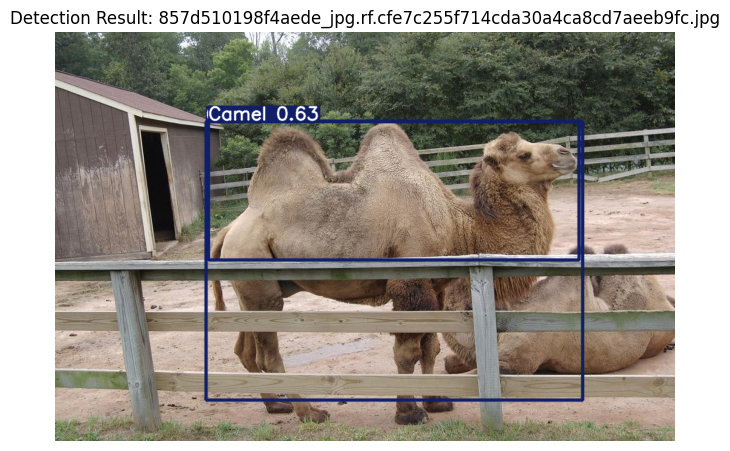


--- Taxonomy details for 'Camel' ---
Animal: Camel
Class: Mammal
Population: 551971
Weight: 3450.09 kg
Length: 12.33 feet
Height: 6.68 feet
Habitats: Urban areas
Status: Vulnerable
Country: Canada
Places: Congo Basin; Yellowstone National Park; Amazon Basin
Factor: Climate change
Measures Taken: Protected areas
Processing image: 067ecdc757a7acf3_jpg.rf.81cc3c76796957b9994056040090766f.jpg
Skipped 067ecdc757a7acf3_jpg.rf.81cc3c76796957b9994056040090766f.jpg: Detected 0 classes.

Processing image: 369496f79592c9ab_jpg.rf.9b4c765d9957a3b7c2252715abc3e4c0.jpg
Detected animal(s): ['Bull']


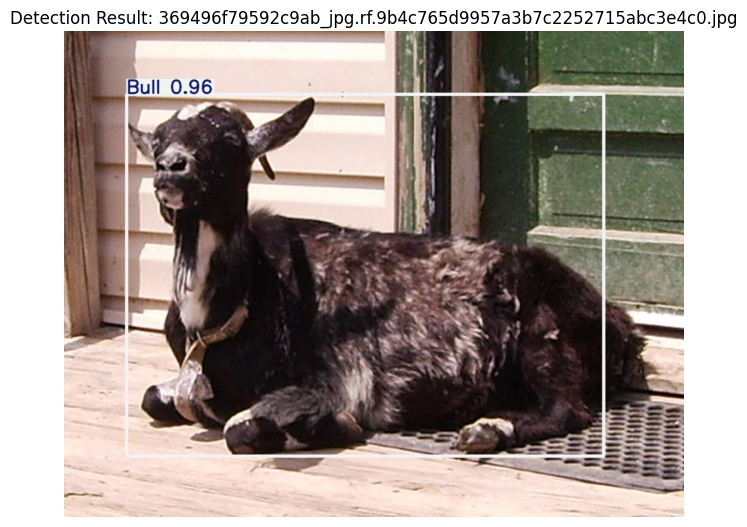


--- Taxonomy details for 'Bull' ---
Animal: Bull
Class: Mammal
Population: 920873
Weight: 2967.72 kg
Length: 23.46 feet
Height: 2.26 feet
Habitats: Urban areas
Status: Least Concern
Country: Australia
Places: Great Barrier Reef; Amazon Basin; Urban areas
Factor: Human-wildlife conflict
Measures Taken: Habitat restoration
Processing image: 1b54f10c3b429a41_jpg.rf.53c32383b9e8779daa2117c048d42791.jpg
Skipped 1b54f10c3b429a41_jpg.rf.53c32383b9e8779daa2117c048d42791.jpg: Detected 3 classes.

Processing image: 3a6e867a5df848b0_jpg.rf.fb5e86225aef57c6491fe7e9ca4609fb.jpg
Detected animal(s): ['Fish']


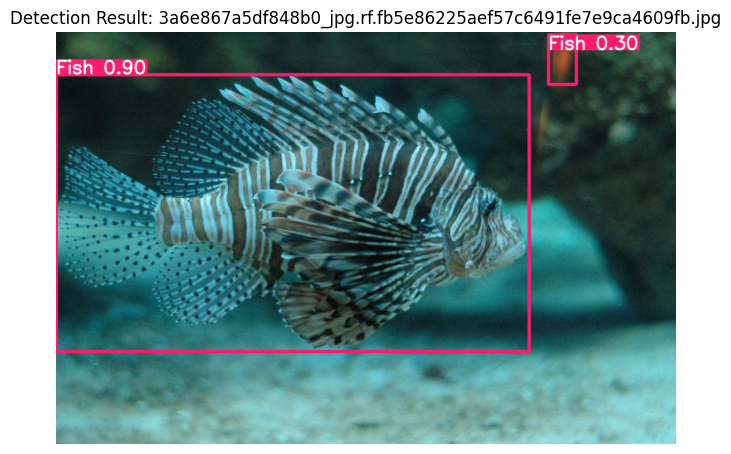


--- Taxonomy details for 'Fish' ---
Animal: Fish
Class: Fish
Population: 782007
Weight: 1258.98 kg
Length: 15.70 feet
Height: 10.02 feet
Habitats: Forests
Status: Extinct
Country: South Africa
Places: Amazon Basin; Congo Basin; Galapagos Islands
Factor: Poaching
Measures Taken: Protected areas
Processing image: 2745d6949073c05e_jpg.rf.0cc02bcf982f66eb4323a02de7c50256.jpg
Detected animal(s): ['Sparrow']


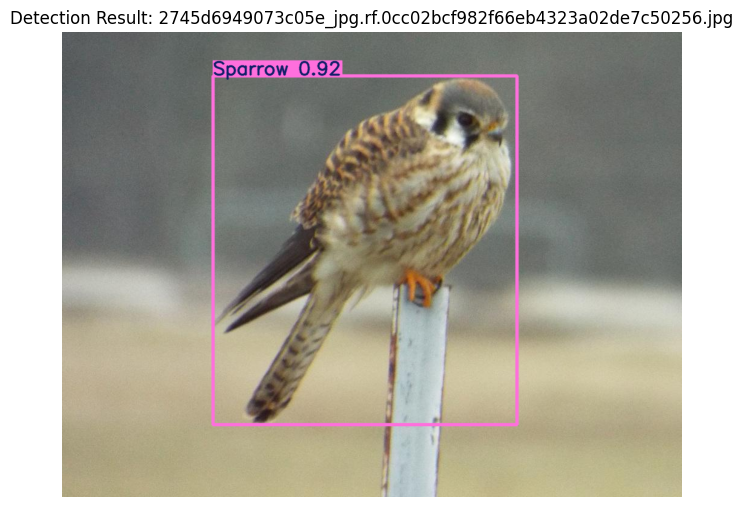


--- Taxonomy details for 'Sparrow' ---
Animal: Sparrow
Class: Bird
Population: 755958
Weight: 315.30 kg
Length: 29.58 feet
Height: 6.85 feet
Habitats: Urban areas
Status: Least Concern
Country: Russia
Places: Serengeti; Himalayas; Sahara Desert
Factor: Habitat loss
Measures Taken: Conservation programs
Processing image: 00dbabf445242ba3_jpg.rf.01711231a6a7d826689b609f1c78d614.jpg
Detected animal(s): ['Goat']


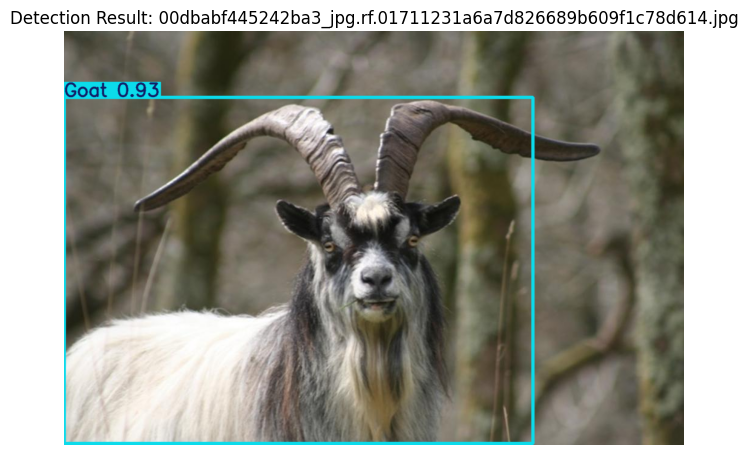


--- Taxonomy details for 'Goat' ---
Animal: Goat
Class: Mammal
Population: 876506
Weight: 1233.08 kg
Length: 7.84 feet
Height: 3.38 feet
Habitats: Arctic regions
Status: Endangered
Country: Canada
Places: Congo Basin; Himalayas; Sahara Desert
Factor: Climate change
Measures Taken: Community education
Processing image: 1c063e049ef508ba_jpg.rf.b17c1c3bec8999544bac7285ed3fab9d.jpg
Detected animal(s): ['Polar-bear']


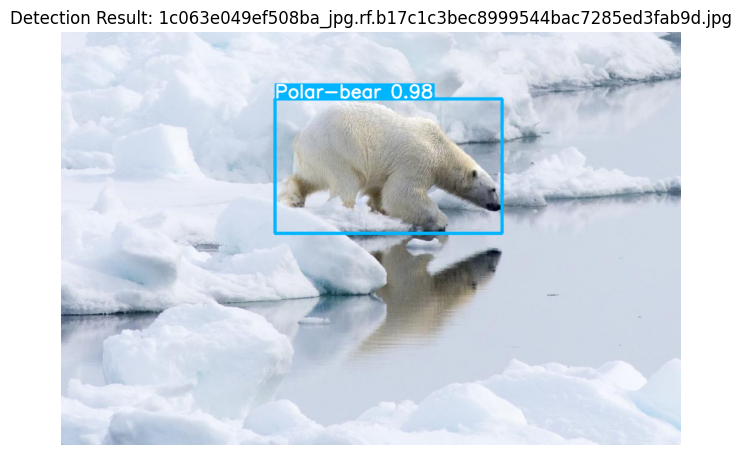


--- Taxonomy details for 'Polar-bear' ---
Animal: Polar-bear
Class: Mammal
Population: 673857
Weight: 3132.39 kg
Length: 8.35 feet
Height: 5.32 feet
Habitats: Arctic regions
Status: Extinct
Country: India
Places: Himalayas; Congo Basin; Amazon Basin
Factor: Habitat loss
Measures Taken: Breeding programs
Processing image: 50e6c341e755c0ca_jpg.rf.51398a4bb90c82e870027dc519d3c1fc.jpg
Skipped 50e6c341e755c0ca_jpg.rf.51398a4bb90c82e870027dc519d3c1fc.jpg: Detected 2 classes.

Processing image: 98b4d1a318ccfffd_jpg.rf.9d92541ed98ead1e43f9cb9b5618d7ec.jpg
Detected animal(s): ['Parrot']


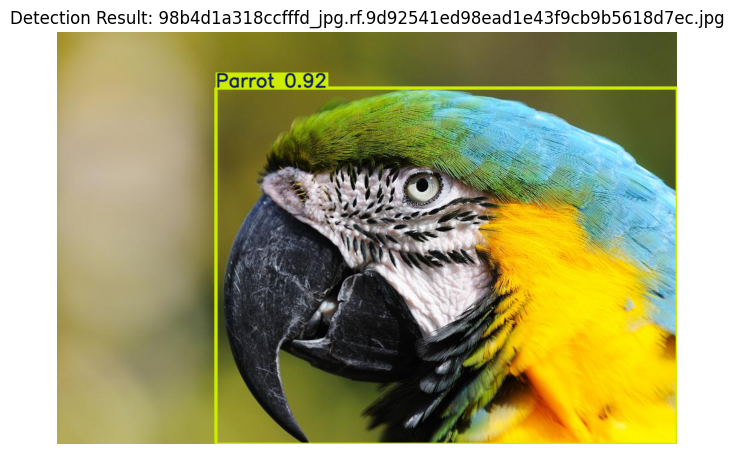


--- Taxonomy details for 'Parrot' ---
Animal: Parrot
Class: Bird
Population: 373767
Weight: 300.24 kg
Length: 9.97 feet
Height: 16.29 feet
Habitats: Freshwater
Status: Least Concern
Country: China
Places: Yellowstone National Park; Urban areas; Galapagos Islands
Factor: Climate change
Measures Taken: Protected areas

Total selected images with exactly one detected class: 20


In [26]:
import os
import cv2
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from ultralytics import YOLO

############################################
# 1) Load the Taxonomy CSV File
############################################
taxonomy_csv_path = "/kaggle/input/taxonmy-details/one_record_per_animal.csv"
taxonomy_df = pd.read_csv(taxonomy_csv_path)
print("Taxonomy CSV preview:")
# print(taxonomy_df.head())

############################################
# 2) Define the Function to Display Taxonomy Details
############################################
def show_taxonomy(animal_name):
    """
    Look up the row in taxonomy_df where 'Animal' matches 'animal_name'
    (case-insensitive) and print all taxonomy details.
    """
    record = taxonomy_df[taxonomy_df['Animal'].str.lower() == animal_name.lower()]
    if record.empty:
        print(f"No taxonomy details found for '{animal_name}'")
    else:
        row = record.iloc[0]
        print(f"\n--- Taxonomy details for '{animal_name}' ---")
        for col in taxonomy_df.columns:
            print(f"{col}: {row[col]}")

############################################
# 3) Load the Saved YOLO Model
############################################
saved_model_path = "/kaggle/working/best_model.pt"
model = YOLO(saved_model_path)

############################################
# 4) Select 20 Random Test Images with Exactly One Detected Class
############################################
test_image_dir = "/kaggle/input/yolo-dataset/test/images"
all_files = os.listdir(test_image_dir)
# Filter for common image extensions
image_files = [f for f in all_files if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

# Shuffle the list of images randomly
random.shuffle(image_files)

selected_images = []
count = 0

print(f"Selecting up to 20 images from: {test_image_dir} that yield exactly one detected class.\n")

for img_file in image_files:
    if count >= 20:
        break

    img_path = os.path.join(test_image_dir, img_file)
    print(f"Processing image: {img_file}")
    
    # Run inference on the image
    results = model.predict(source=img_path, conf=0.25, verbose=False)
    
    # Check if there are any detections
    if results[0].boxes is not None and results[0].boxes.cls is not None:
        # Get detected class IDs (supporting GPU or CPU tensor extraction)
        detected_class_ids = (results[0].boxes.cls.cpu().numpy() 
                              if hasattr(results[0].boxes.cls, "cpu") 
                              else results[0].boxes.cls)
        unique_class_ids = np.unique(detected_class_ids)
        
        # Proceed only if exactly one unique class is detected
        if len(unique_class_ids) == 1:
            detected_names = [results[0].names[int(cls_id)] for cls_id in unique_class_ids]
            print("Detected animal(s):", detected_names)
            
            # Display the detection result
            annotated_img = results[0].plot()
            annotated_img = cv2.cvtColor(annotated_img, cv2.COLOR_BGR2RGB)
            plt.figure(figsize=(8, 8))
            plt.imshow(annotated_img)
            plt.axis("off")
            plt.title(f"Detection Result: {img_file}")
            plt.show()
            
            # Display taxonomy details for the detected animal
            for animal in detected_names:
                show_taxonomy(animal)
            
            # Add the image to the selection and increment counter
            selected_images.append(img_file)
            count += 1
        else:
            print(f"Skipped {img_file}: Detected {len(unique_class_ids)} classes.\n")
    else:
        print(f"Skipped {img_file}: No detections found.\n")

print(f"\nTotal selected images with exactly one detected class: {count}")
